In [1]:
# install any packages not already in environment

#pip install xlrd

## 01 Data Processing

#### Tube

Trend Data:
1. Load in Tube Taps data and see if we can plot trends
2. Disaggregate Tube Journeys data by Tube Taps seasonality, add to trend
3. Build master dataset with this information
4. Calculate Origin/Destination data
5. Add in Covid data based on origin/destination

Spatial Data:
1. Convert Tube data to spatial data
2. Disaggregate Tube Journeys by Tube Taps seasonality and spatially
3. Add in Covid Spatial Data
4. Build master dataset with this information


#### Bus


#### Cycling


#### Covid


#### Economy

In [380]:
# Import modules

import pandas as pd
import json, requests
import datetime
from datetime import datetime
import io
import os
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.dates import date2num
from pylab import rcParams
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.stats.stattools import durbin_watson
import scipy as sp
import math
from math import sqrt
#import libpysal
#import pysal
#from libpysal.model import spreg
#from libpysal.lib import weights
#from libpysal.explore import esda
#import geoplot as gplt
import mapclassify as mc
import plotly
import xlrd
import http.client, urllib.request, urllib.parse, urllib.error, base64
import numpy as np
import random
random.seed(42)
sns.set_theme(style="whitegrid")
pd.options.display.float_format = '{:,.2f}'.format
#sns.set(font_scale=2)

In [2]:
# Creating a calendar to conduct left joins against

# Code adapted from: https://stackoverflow.com/questions/47150709/how-to-create-a-calendar-table-date-dimension-in-pandas

def create_date_table(start='2015-01-01', end='2023-12-31'):
   
   df = pd.DataFrame({"date": pd.date_range(start, end)})
   #df["week_day"] = df.date.dt.weekday_name
   df["day"] = df.date.dt.day
   df["weekday"] = df.date.apply(lambda x: x.strftime('%A'))
   df["month"] = df.date.dt.month
   df["week"] = df.date.apply(lambda x: x.strftime('%W'))
   #df["quarter"] = df.date.dt.quarter
   df["year"] = df.date.dt.year
   #df.insert(0, 'date_id', (df.year.astype(str) + df.month.astype(str).str.zfill(2) + df.day.astype(str).str.zfill(2)).astype(int))
   return df


In [3]:
## Read in data

# Excel/CSVs
tfljourneys = pd.read_excel('tfl-journeys-type.xls', sheet_name = 'Journeys')
tubetaps2020 = pd.read_csv('tubetaps2020.csv') # contains Rail, Tram, Riverbus ~8M trips of 1.3B
#tubetaps2018 = pd.read_csv('FOI 2996_update.csv') # seems to only be Rail
tubetaps1517 = pd.read_csv('tubetaps1517.csv')
tubetaps1718 = pd.read_csv('tubetaps1718.csv')
tubetaps1819 = pd.read_csv('tubetaps1819.csv')
tubetaps1920 = pd.read_csv('tubetaps1920.csv')
tubetaps2021 = pd.read_csv('tubetaps2021.csv')
stnref = pd.read_csv('stn_gridref.csv')

coviddeaths = pd.read_csv('2021-04-30_llt_deathrate.csv') # Local Authority, timing is important
covidrestrictions = pd.read_csv('restrictions_daily.csv') # Global, timing is important
busservice2019 = pd.read_excel('bus-service-usage-19-20.xls', sheet_name = '2019')
imd_la = pd.read_csv('Local_Authority_(Lower_Tier)_IMD_2019_(OSGB1936).csv') # Local Authority, no geometry
geolookup = pd.read_csv('2011_OA-LSOA-MSOA-LA.csv')
#busservice2019 = busservice['2019-2020 52 and 48 weeks']

# Shape Files
tubestation = gpd.read_file('underground/underground.shp')
tflstation = gpd.read_file('tfl_stations.json')
boroughs = gpd.read_file('statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp')
msoas = gpd.read_file('statistical-gis-boundaries-london/ESRI/MSOA_2011_London_gen_MHW.shp')
imd = gpd.read_file('IMD_2019/Indices_of_Multiple_deprivation_(IMD)_2019.shp') #LSOA, smaller than MSOA
                         
tflstation = tflstation.to_crs('epsg:27700')
boroughs = boroughs.to_crs('epsg:27700')
msoas = msoas.to_crs('epsg:27700')
imd = imd.to_crs('epsg:27700')


# Create a calendar
calendar = create_date_table()

In [8]:
# Check data loading

tfljourneys.head()
#tfljourneys.info()
#tubetaps2020.head()
#tubetaps2020.info()
#tubestation.head()
#stnref.head()
#tflstation.head()
#tflstation.info()
#boroughs.head()
#calendar.head()
#covidrestrictions.head()
#covidrestrictions.info()
#coviddeaths.head()
#imd.head()
#imd.info()

,Period and Financial year,Reporting Period,Days in period,Period beginning,Period ending,Bus journeys (m),Underground journeys (m),DLR Journeys (m),Tram Journeys (m),Overground Journeys (m),Emirates Airline Journeys (m),TfL Rail Journeys (m)
0,01_10/11,1,31,2010-04-01,2010-05-01,189.11,90.55,6.29,2.29,NaN,NaN,NaN
1,02_10/11,2,28,2010-05-02,2010-05-29,181.60,84.52,5.81,2.15,NaN,NaN,NaN
2,03_10/11,3,28,2010-05-30,2010-06-26,175.88,84.29,5.75,2.13,NaN,NaN,NaN
3,04_10/11,4,28,2010-06-27,2010-07-24,183.43,86.48,6.06,2.14,NaN,NaN,NaN
4,05_10/11,5,28,2010-07-25,2010-08-21,160.42,82.90,5.77,2.01,NaN,NaN,NaN


In [9]:
# Create a singular rail dataframe

tubetaps1517 = tubetaps1517.rename({'Traffic Date': 'Travel Date'}, axis = 1)
tubetaps1718 = tubetaps1718.rename({'Traffic Date': 'Travel Date'}, axis = 1)
tubetaps2020 = tubetaps2020.rename({'Travel Location Name': 'Rail Station Name'}, axis = 1)
tubetaps2020['Travel Date'] = pd.to_datetime(tubetaps2020['Travel Date'])
tubetaps0920 = tubetaps2020[['Rail Station Name', 'Travel Date', 'Transaction Type', 'Count of Taps']]

tubetaps = tubetaps1517.append(tubetaps1718)
tubetaps = tubetaps.append(tubetaps1819)
tubetaps = tubetaps.append(tubetaps1920)
tubetaps = tubetaps.append(tubetaps2021)
tubetaps = tubetaps.append(tubetaps0920[tubetaps0920['Travel Date'] >= '8/23/2020'])

tubetaps = tubetaps.rename({'Rail Station Name': 'travel_location',
                'Travel Date': 'travel_date',
                'Transaction Type': 'transaction_type',
                'Count of Taps': 'taps'},
               axis = 1)


#tubetaps.head()

In [10]:
## TfL Journeys, for sanity checking aggregate data

# Join Period Ending against Calendar to get Monthly/Yearly columns
# Convert metrics to millions to align with Tube Taps count

tfljourneys = tfljourneys.merge(calendar, how='right', left_on="Period beginning", right_on="date")
tfljourneys['underground'] = tfljourneys['Underground journeys (m)']*1000000
tfljourneys['bus'] = tfljourneys['Bus journeys (m)']*1000000

#tfljourneys.head()

In [11]:
# Convert stn ref to geometric dataframe
stnref = gpd.GeoDataFrame(stnref, geometry = gpd.points_from_xy(stnref.Easting, stnref.Northing))

#stnref.head()

In [93]:
# Create Origin Destination trips

###*** NEED TO FIX ***
# Tottenham Hale is duplicating, there are quite a few NaN's that we need to ensure can be dropped safely.

# First get unique set of travel stations & dates

df = tubetaps[['travel_location', 'travel_date']].drop_duplicates()

df = df.merge(tubetaps[tubetaps['transaction_type']=='Entry'], left_on = ['travel_location', 'travel_date'], right_on = ['travel_location', 'travel_date'])
df.drop(['transaction_type'], axis=1, inplace=True)
df = df.rename({'taps': 'origin_trips'}, axis = 1)#, inplace = True)

df = df.merge(tubetaps[tubetaps['transaction_type']=='Exit'], left_on = ['travel_location', 'travel_date'], right_on = ['travel_location', 'travel_date'])
df.drop(['transaction_type'], axis=1, inplace=True)
df = df.rename({'taps': 'destination_trips'}, axis = 1)#, inplace = True)
                                                                                                                         
                                                                                                                                                                                                                                   
# Convert travel_date to date
df['travel_date'] = pd.to_datetime(df['travel_date'])

# Merge station reference and calendar against daily unique tube trips
rail_station = tubetaps2020[['Travel Location No', 'Rail Station Name', 'Transport Mode']].drop_duplicates()
rail_station = rail_station[rail_station['Transport Mode']=='Rail']
rail_station = stnref.merge(rail_station, how = 'right', left_on = 'Master NLC', right_on = 'Travel Location No')

# There are travel locations in the tubetaps data that do not align to stnref -- secondary station entrance where we 
# should capture the volume, can't drop these. This may require a for loop to impute the data.
# We also have an issue with duplicating Tottenham Hale as rail_station has multiple names, but same geometry.
# May need to pull a new set of rail_station to remove duplicates: Elephant & Castle, Tottenham Hale.


tubetaps_final = df.merge(rail_station, how = 'left', left_on = 'travel_location', right_on = 'Rail Station Name')
tubetaps_final = tubetaps_final[['travel_location', 'Master NLC', 'travel_date', 'origin_trips', 'destination_trips', 'geometry']]
tubetaps_final = tubetaps_final.rename({'Master NLC': 'master_nlc'}, axis = 1)
tubetaps_final = tubetaps_final.merge(calendar, left_on = 'travel_date', right_on = 'date')


#tubetaps.info()
#tubetaps.head()
tubetaps_final.sample(6, random_state = 42)

,travel_location,master_nlc,travel_date,origin_trips,destination_trips,geometry,date,day,weekday,month,week,year
922371,Willesden Green,765.00,2019-11-26,12776,12513,POINT (523362.852 184882.027),2019-11-26,26,Tuesday,11,47,2019
619143,Seven Sisters,698.00,2017-12-23,18820,17762,POINT (533477.779 188823.722),2017-12-23,23,Saturday,12,51,2017
1158222,Buckhurst Hill,531.00,2020-07-03,589,544,POINT (541777.137 193886.826),2020-07-03,3,Friday,7,26,2020
1026751,Bruce Grove,"6,958.00",2019-04-19,779,561,POINT (533782.660 190082.361),2019-04-19,19,Friday,4,15,2019
795423,East Putney,567.00,2019-03-08,10340,9774,POINT (524370.722 174810.043),2019-03-08,8,Friday,3,09,2019
384331,Goldhawk Road,585.00,2016-04-09,2185,2082,POINT (523190.008 179581.800),2016-04-09,9,Saturday,4,14,2016


In [94]:
df = tubetaps_final
is_NaN =df.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = df[row_has_NaN]
rows_with_NaN
print(rows_with_NaN['origin_trips'].agg('sum') + rows_with_NaN['destination_trips'].agg('sum'))

2161928857


In [95]:
test = rail_station.groupby(['Rail Station Name', 'Transport Mode'])['Unique Station Name'].agg('count')
test = pd.DataFrame(test).reset_index()
test[test['Unique Station Name']>1]

,Rail Station Name,Transport Mode,Unique Station Name
182,Elephant & Castle,Rail,2
586,Tottenham Hale,Rail,2


In [96]:
# Sanity checking how many trips are lost by the join for station reference. Approximately 3B are unaccounted for.
# Less than 1B trips are lost due to Rail Transport Mode.
print(tubetaps_final['origin_trips'].agg('sum') + tubetaps_final['destination_trips'].agg('sum'))
print(df['origin_trips'].agg('sum') + df['destination_trips'].agg('sum'))
print(tubetaps[tubetaps['transaction_type']!='PVal']['taps'].agg('sum'))

18354039132
18354039132
17012488013


In [97]:
# Convert df to GDF.

tubetaps_final = gpd.GeoDataFrame(tubetaps_final, crs = 'epsg:27700')
print(tubetaps_final['origin_trips'].agg('sum') + tubetaps_final['destination_trips'].agg('sum'))

tubetaps_final = gpd.sjoin(tubetaps_final, msoas, op = 'within') # this will return msoas polygon, spatial join against boroughs returns the same, but msoas gives us a smaller dimension
print(tubetaps_final['origin_trips'].agg('sum') + tubetaps_final['destination_trips'].agg('sum'))

#tubetaps_final.info()
#tubetaps.sample(6, random_state = 42)

18354039132
15897218260


In [98]:
tubetaps_final.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1139832 entries, 0 to 1308675
Data columns (total 25 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   travel_location    1139832 non-null  object        
 1   master_nlc         1139832 non-null  float64       
 2   travel_date        1139832 non-null  datetime64[ns]
 3   origin_trips       1139832 non-null  int64         
 4   destination_trips  1139832 non-null  int64         
 5   geometry           1139832 non-null  geometry      
 6   date               1139832 non-null  datetime64[ns]
 7   day                1139832 non-null  int64         
 8   weekday            1139832 non-null  object        
 9   month              1139832 non-null  int64         
 10  week               1139832 non-null  object        
 11  year               1139832 non-null  int64         
 12  index_right        1139832 non-null  int64         
 13  MSOA11CD           

In [99]:
tubetaps_final = tubetaps_final[['travel_location',
        'master_nlc',
        'travel_date',
        'origin_trips',
        'destination_trips',
        'geometry',
        'date',
        'day',
        'weekday',
        'month',
        'week',
        'year',
        'MSOA11CD',
        'MSOA11NM',
        'LAD11CD',
        'LAD11NM']]

### Dataset & Feature Creation

1. Create a dataset for MSOA vs. Local Authority
2. Add features (IMD, working population, Covid Restrictions at appropriate level). 

In [100]:
# Group by MSOA, and Local Authority, count number of stations. Convert back into geodataframe for IMD join.

### *** NEED TO INVESTIGATE *** ###
# City of London has different number of master_nlc's depending on the day, need to think about this when we aggregate without days.
# There are a different number of stations per day, likely based on what is operational. This will need to be averaged
# at higher levels of aggergation.


rail_msoa = tubetaps_final.groupby(['year',
                                     'month',
                                     'week',
                                     'weekday',
                                     'day',
                                     'travel_date',
                                     'date',
                                     'MSOA11CD',
                                     'MSOA11NM']).agg({'origin_trips':'sum',
                                                     'destination_trips': 'sum',
                                                     'master_nlc': 'count'}).reset_index()

rail_msoa = rail_msoa.merge(msoas, left_on = ['MSOA11CD','MSOA11NM'] , right_on = ['MSOA11CD','MSOA11NM'])
rail_msoa = rail_msoa[['year','month','week','weekday','day','travel_date','date','MSOA11CD','MSOA11NM', 'geometry','origin_trips', 'destination_trips', 'master_nlc']]
rail_msoa = gpd.GeoDataFrame(rail_msoa, crs = 'epsg:27700')

rail_la = tubetaps_final.groupby(['year',
                                     'month',
                                     'week',
                                     'weekday',
                                     'day',
                                     'travel_date',
                                     'date',
                                     'LAD11CD',
                                     'LAD11NM']).agg({'origin_trips':'sum',
                                                     'destination_trips': 'sum',
                                                     'master_nlc': 'count'}).reset_index()

rail_la = rail_la.merge(boroughs, left_on = 'LAD11CD', right_on = 'GSS_CODE')
rail_la = rail_la[['year','month','week','weekday','day', 'travel_date','date','LAD11CD','LAD11NM', 'origin_trips', 'destination_trips', 'master_nlc']]

In [108]:
# Create indicators for weekday and log the dependent variable as we know we'll need it later.
# Weekday Indicator

indicator = {'Monday': 'weekday', 'Tuesday': 'weekday', 'Wednesday':'weekday', 'Thursday': 'weekday', 'Friday': 'weekday', 'Saturday':'weekend', 'Sunday':'weekend'}
rail_msoa['weekend_indicator'] = 0
rail_msoa['weekend_indicator'] = rail_msoa['weekday'].map(indicator)
rail_la['weekend_indicator'] = 0
rail_la['weekend_indicator'] = rail_la['weekday'].map(indicator)

# Log dependent variables
rail_msoa['log_origin_trips'] = np.log(rail_msoa['origin_trips'])
rail_msoa['log_destination_trips'] = np.log(rail_msoa['destination_trips'])
rail_la['log_origin_trips'] = np.log(rail_la['origin_trips'])
rail_la['log_destination_trips'] = np.log(rail_la['destination_trips'])

In [109]:
# Rename columns

rail_msoa = rail_msoa.rename({'MSOA11NM':'msoa_name',
                       'MSOA11CD':'msoa_code',
                       'master_nlc':'number_tubestations'}, axis = 1)

rail_la = rail_la.rename({'LAD11NM':'la_name',
                       'LAD11CD':'la_code',
                       'master_nlc':'number_tubestations'}, axis = 1)


In [110]:
## Preparing dataframe to be a Time Series dataframe

# First need to create an index that is datetime

rail_msoa = rail_msoa.set_index('travel_date')
rail_msoa.index

rail_la = rail_la.set_index('travel_date')
rail_la.index

DatetimeIndex(['2015-05-31', '2015-06-05', '2015-06-01', '2015-06-06',
               '2015-06-07', '2015-06-04', '2015-06-02', '2015-06-03',
               '2015-06-12', '2015-06-08',
               ...
               '2020-11-17', '2020-11-18', '2020-11-27', '2020-11-23',
               '2020-11-28', '2020-11-29', '2020-11-26', '2020-11-24',
               '2020-11-25', '2020-11-30'],
              dtype='datetime64[ns]', name='travel_date', length=66251, freq=None)

In [111]:
# Checking for NaNs

df = rail_la
is_NaN =df.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = df[row_has_NaN]
rows_with_NaN
print(rows_with_NaN['origin_trips'].agg('sum') + rows_with_NaN['destination_trips'].agg('sum'))

0


### Time Series Model

In [112]:
# Right now, the model is at a total level, but we want it to go LA and then MSOA.
# 1. Plot the trend, which looks fairly stable till 2020
# 2. Boxplots of annual and monthly data to see trends and seasonality
# 2.1. With these trends, we can determine that the data is dependent on time, and we want a stationary dataset
# 2.2. Ensuring the dataset is stationary removes autocorrelation -- we need to include a lag to do so. 
# 3. Therefore, we test for stationarity and build features to support stationarity if needed.
# 4. Data must be detrended and deseasonalised

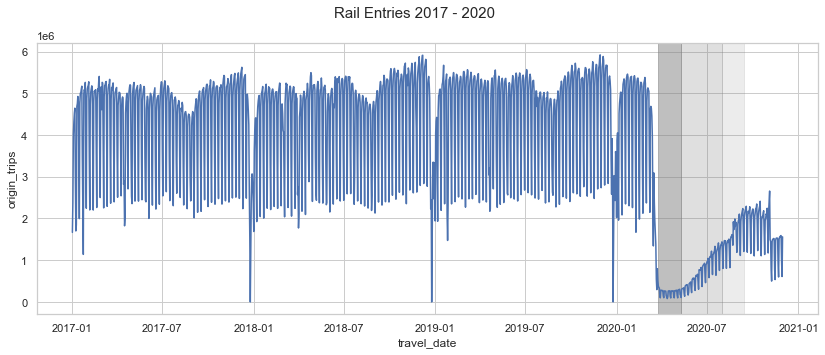

In [113]:
fig, ax = plt.subplots(1, 1, figsize=(14, 5), sharex=False, sharey=False)
fig.suptitle('Rail Entries 2017 - 2020', fontsize=15)

df = rail_la[rail_la['date']>='01/01/2017']
df = df.groupby(['travel_date'])['origin_trips'].agg('sum')
df = pd.DataFrame(df).reset_index()
sns.lineplot(data = df, x = "travel_date", y = "origin_trips", ci = None)
ax.axvspan(date2num(datetime(2020,3,24)), date2num(datetime(2020,5,10)), color="grey", alpha=0.50)
ax.axvspan(date2num(datetime(2020,5,10)), date2num(datetime(2020,8,1)), color="grey", alpha=0.25)
ax.axvspan(date2num(datetime(2020,8,1)), date2num(datetime(2020,9,14)), color="grey", alpha=0.15)

Text(0.5, 1.0, 'Boxplot: Monthly Origin Trips 2019')

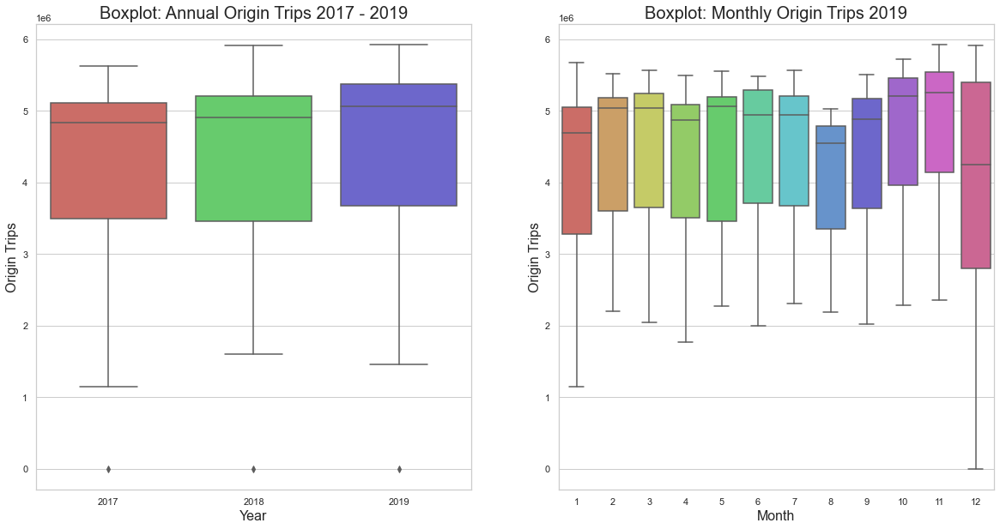

In [117]:
f,ax = plt.subplots(1, 2, figsize = (20,10))

df = rail_la[(rail_la['date']>='01/01/2017')&(rail_la['date']<='12/31/2019')]
df = df.groupby(['month','year', 'travel_date'])['origin_trips'].agg('sum')
df = pd.DataFrame(df).reset_index()

df2 = rail_la[(rail_la['date']>='01/01/2019')&(rail_la['date']<='12/31/2019')]
df2 = df.groupby(['month','year', 'travel_date'])['origin_trips'].agg('sum')
df2 = pd.DataFrame(df).reset_index()

p = sns.boxplot(x='year', y='origin_trips', data = df, palette = 'hls', ax = ax[0])
q = sns.boxplot(x='month', y = 'origin_trips', data = df2, palette = 'hls', ax = ax[1])

p.set_xlabel("Year", fontsize = 16)
p.set_ylabel("Origin Trips", fontsize = 16)
p.set_title("Boxplot: Annual Origin Trips 2017 - 2019", fontsize = 20)

q.set_xlabel("Month", fontsize = 16)
q.set_ylabel("Origin Trips", fontsize = 16)
q.set_title("Boxplot: Monthly Origin Trips 2019", fontsize = 20)

In [120]:
df.groupby('year').describe()

month                                      origin_trips               \
      count mean  std  min  25%  50%   75%   max        count         mean   
year                                                                         
2017 365.00 6.53 3.45 1.00 4.00 7.00 10.00 12.00       365.00 4,272,853.52   
2018 365.00 6.53 3.45 1.00 4.00 7.00 10.00 12.00       365.00 4,386,997.85   
2019 365.00 6.53 3.45 1.00 4.00 7.00 10.00 12.00       365.00 4,515,023.33   

                                                                              
              std    min          25%          50%          75%          max  
year                                                                          
2017 1,123,029.12 145.00 3,491,054.00 4,838,490.00 5,112,488.00 5,622,320.00  
2018 1,145,881.54 126.00 3,463,131.00 4,904,502.00 5,206,914.00 5,911,839.00  
2019 1,160,761.00 185.00 3,667,410.00 5,063,305.00 5,372,960.00 5,920,484.00

Text(0.5, 1.0, '2017 - 2019 Median Trips by Weekday')

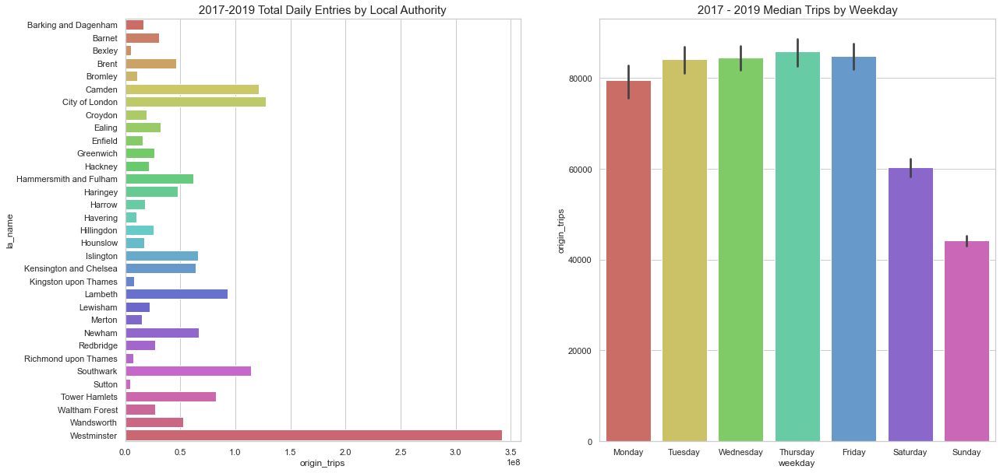

In [125]:
# Exploratory Analysis: Trend Line of Observed Data, and Plot of Autocorrelation to justify lag
# Second plot should include median trips by weekday by year till 2019.
f,ax = plt.subplots(1, 2, figsize = (20,10))

# Dataframe for Line plot
df = rail_la.reset_index()
df = df[(df['travel_date']>='01/01/2019')&(df['travel_date']<='12/31/2019')].groupby(['la_name'])['origin_trips'].agg('sum')
df = pd.DataFrame(df)
df = df.reset_index()

# Dataframe for % distribution of trips by weekday
df2 = rail_la.reset_index()
df2 = df2[(df2['travel_date']>='01/01/2019')&(df2['travel_date']<='12/31/2019')].groupby(['weekday', 'month', 'year'])['origin_trips'].agg('median')
df2 = pd.DataFrame(df2)
df2 = df2.reset_index()


sns.barplot(data = df, x = "origin_trips", y = "la_name", palette = 'hls', ax=ax[0])
sns.barplot(data = df2, x = "weekday", y = "origin_trips", ax = ax[1], palette = 'hls', order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

ax[0].set_title('2017-2019 Total Daily Entries by Local Authority', fontsize = 15)
ax[1].set_title('2017 - 2019 Median Trips by Weekday', fontsize = 15)


Text(0.5, 1.0, 'Logged Daily Entries 2017 - 2019')

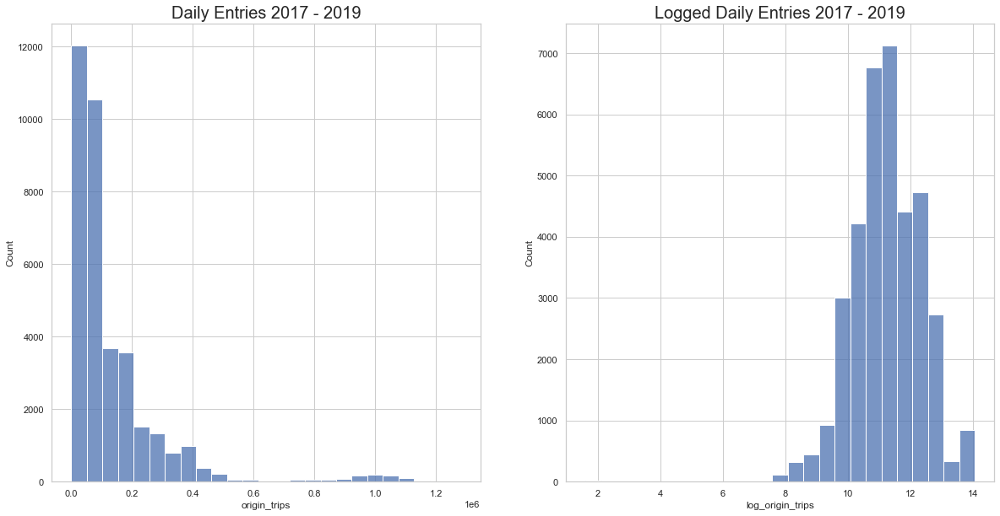

In [131]:
# Histogram of origin_trips, clearly we need to log transform the trips. Which changes everything.
fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharex=False, sharey=False)

df = rail_la.reset_index() #msoa appears to have a more normal distribution, important to highlight
df = df[(df['travel_date']>='01/01/2017')&(df['travel_date']<='12/31/2019')]

p = sns.histplot(data=df, x='origin_trips', bins = 25, ax=ax[0])
q = sns.histplot(data=df, x='log_origin_trips', bins = 25, ax=ax[1])
p.set_title("Daily Entries 2017 - 2019", fontsize = 20)
q.set_title("Logged Daily Entries 2017 - 2019", fontsize = 20)

Text(0.5, 1.0, 'Logged Daily Entries 2017 - 2019')

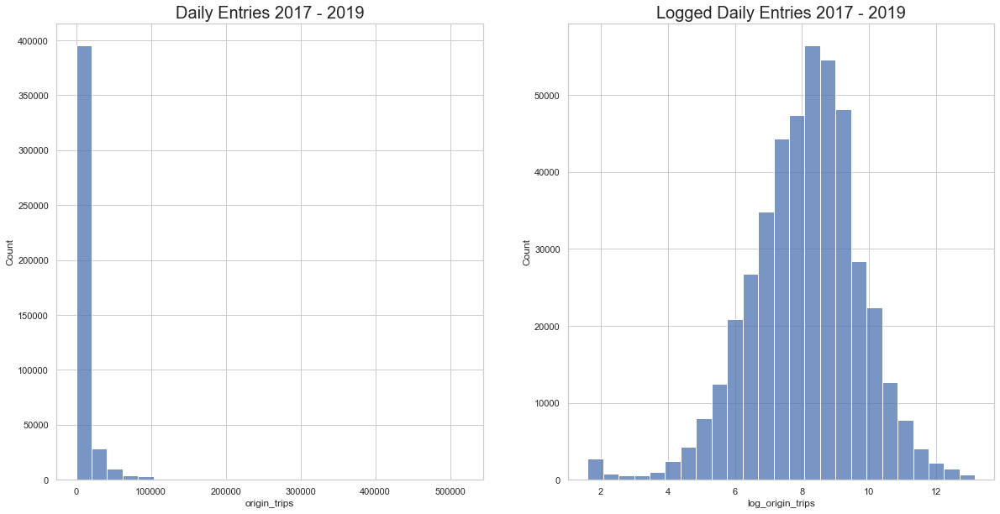

In [132]:
# Histogram of origin_trips, clearly we need to log transform the trips. Which changes everything.
fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharex=False, sharey=False)

df = rail_msoa.reset_index() #msoa appears to have a more normal distribution, important to highlight
df = df[(df['travel_date']>='01/01/2017')&(df['travel_date']<='12/31/2019')]

p = sns.histplot(data=df, x='origin_trips', bins = 25, ax=ax[0])
q = sns.histplot(data=df, x='log_origin_trips', bins = 25, ax=ax[1])
p.set_title("Daily Entries 2017 - 2019", fontsize = 20)
q.set_title("Logged Daily Entries 2017 - 2019", fontsize = 20)

In [133]:
# Conduct a Dickey Fuller (Unit Root) test for stationarity to prove what we are seeing visually.
# Null hypothesis is that the time series is non-stationary
# P-value is less than .05, and the null hypothesis is rejected. Therefore, this data is stationary..
# https://www.machinelearningplus.com/time-series/time-series-analysis-python/
df = rail_la[(rail_la['date']>='01/01/2017')&(rail_la['date']<='12/31/2019')]
result = adfuller(df['log_origin_trips'].values, autolag = 'AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critical Values:')
    print(f'  {key}, {value}')

ADF Statistic: -4.649813216979616
p-value: 0.00010444892367010198
Critical Values:
  1%, -3.430531599638555
Critical Values:
  5%, -2.8616202626236475
Critical Values:
  10%, -2.5668127212596294


In [619]:
# Detrend data, right now we're using statmodels, but maybe subtract the mean for your own sanity
# Need a datetime index for decomposition to work per https://ourcodingclub.github.io/tutorials/pandas-time-series/

#test2 = test.set_index('travel_date')
#df = rail_la[(rail_la['date']>='01/01/2017')&(rail_la['date']<='12/31/2019')]
#df = df.reset_index()
#df = df.groupby('travel_date')['log_origin_trips'].agg('sum').reset_index()
#df = df.set_index('travel_date')
#df.sort_index(inplace = True)

#fig, ax = plt.subplots(1, 1, figsize=(16, 8), sharex=False, sharey=False)
#result_mul = seasonal_decompose(df['log_origin_trips'], period = df.index, model = 'multiplicative', extrapolate_trend = 'freq')
#detrended = df['log_origin_trips'].values - result_mul.trend
#plt.plot(detrended)

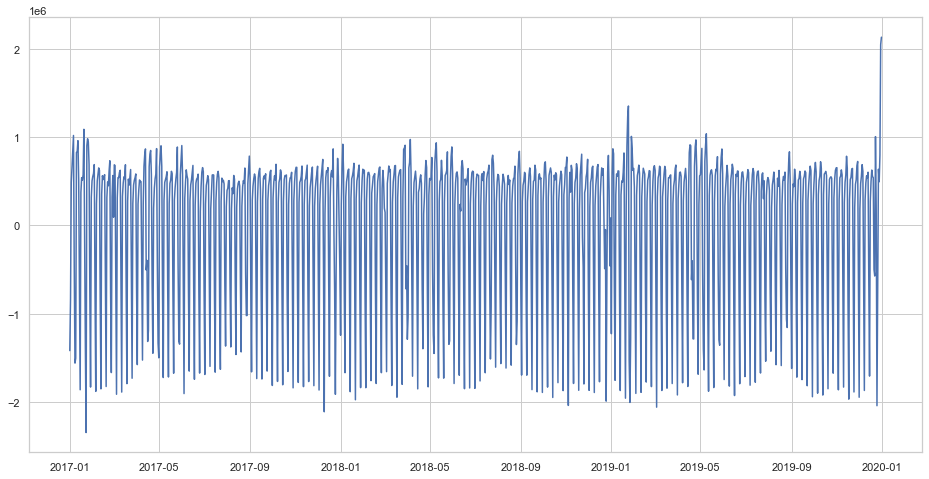

In [193]:
# Deasonalise the data by dividing values by the seasonal index

#deseasonalised = df['log_origin_trips'].values/result_mul.seasonal

#fig, ax = plt.subplots(1, 1, figsize=(16, 8), sharex=False, sharey=False)
#plt.plot(deseasonalised)

NameError: name 'result_mul' is not defined

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

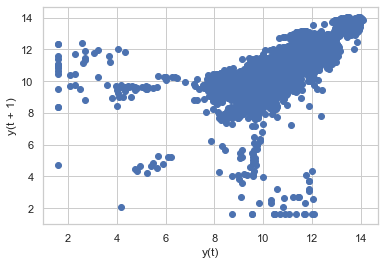

In [134]:
# Checking for autocorrelation
# https://machinelearningmastery.com/autoregression-models-time-series-forecasting-python/
pd.plotting.lag_plot(df['log_origin_trips'])

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

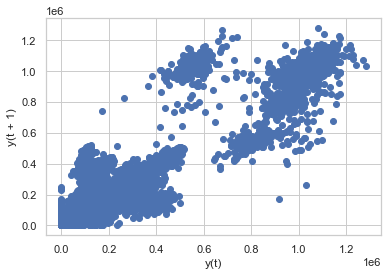

In [135]:
pd.plotting.lag_plot(df['origin_trips'])

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

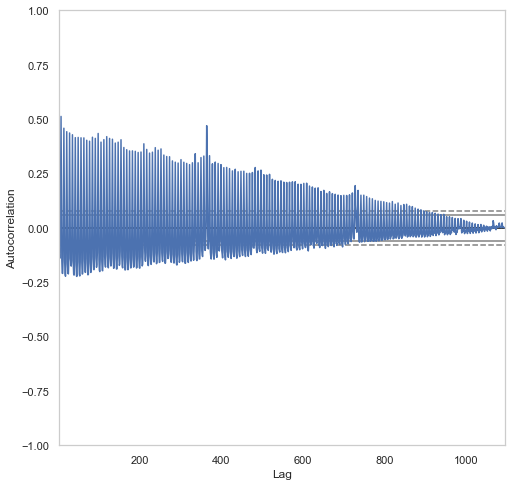

In [1243]:
#pd.plotting.autocorrelation_plot(test2['log_origin_trips'])

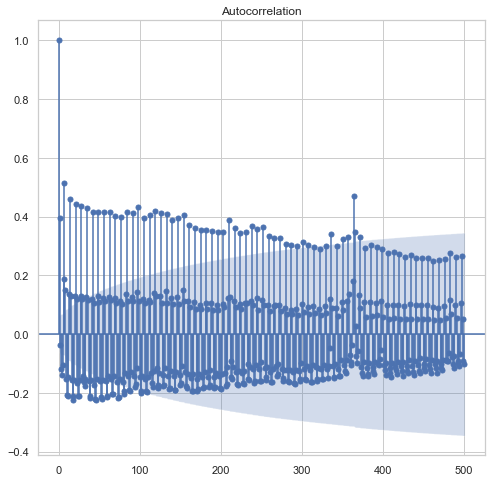

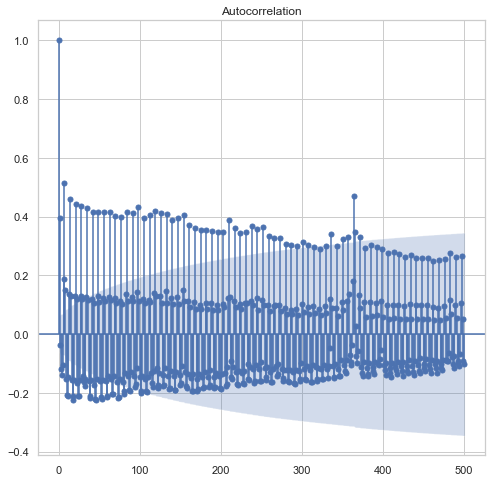

In [1244]:
# Limit the Autocorrelation to just over a year to confirm that after 365, the correlation appears to decrease.
#plot_acf(test2['log_origin_trips'], lags = 500)

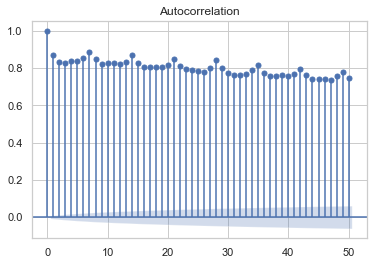

In [136]:
#f,ax = plt.subplots(1, 1, figsize = (20,10))

df = rail_la.reset_index()
#df = df.groupby('la_name')['origin_trips'].agg('sum')
#df.values
plot_acf(df['log_origin_trips'], lags = 50);

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\pandas\plotting\_matplotlib\misc.py:443: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  ax = plt.gca(xlim=(1, n), ylim=(-1.0, 1.0))


Text(0.5, 1.0, 'Autocorrelation Plot: 2017 - 2020 Entry Data')

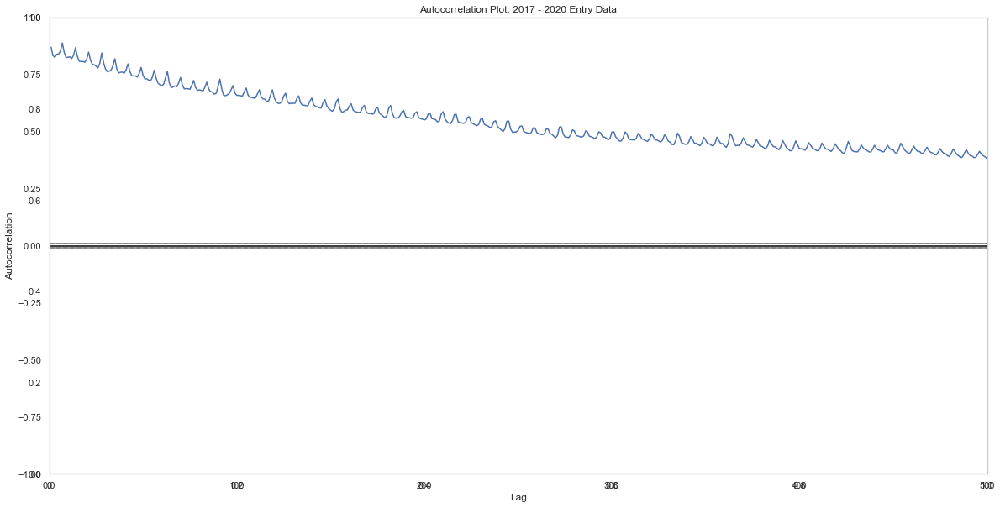

In [197]:
# Exploratory Analysis: Trend Line of Observed Data, and Plot of Autocorrelation to justify lag
# Second plot should include median trips by weekday by year till 2019.
#f,ax = plt.subplots(1, 1, figsize = (20,10))

# Dataframe for Autocorrelation plot
#df = rail_la.reset_index()
#df = df.set_index('travel_date')
#df.sort_index(inplace = True)


#pd.plotting.autocorrelation_plot(df['log_origin_trips']).set_xlim([0,500])
#plot_acf(df2['origin_trips'], lags = 500, ax = ax[1]); #semi-colon to prevent double plotting

#ax.set_title('Autocorrelation Plot: 2017 - 2020 Entry Data')

#### Modelling Time Series

#### Local Authority Time Series Model

In [137]:
def create_ols(df_orig, granularity, df_output, model_name):
    
    df = df_orig.reset_index()
    df = df.sort_values(by = [granularity, 'travel_date'])
    
    # Create dummies for modelling
    dummies = pd.get_dummies(df['month'], prefix = 'month_', drop_first = True) #dropping a column because 'dummy trap'
    df = pd.concat([df, dummies], axis = 1)
    
    dummies2 = pd.get_dummies(df['weekend_indicator'], drop_first = True)
    df = pd.concat([df, dummies2], axis = 1)
    
    # Create a log variable of the aggregated dataset
    df['lag_origin'] = df['origin_trips'].shift(1)
    df['lag_logorigin'] = df['log_origin_trips'].shift(1)
    # fill na for first row with a NaN value
    df['lag_origin'] = df['lag_origin'].fillna(0)
    df['lag_logorigin'] = df['lag_logorigin'].fillna(0)
    
    # Create a train dataset to build regression model from
    df_train = df[(df['travel_date']>='01/01/2017')&(df['travel_date']<='12/31/2019')]
    
    # Create OLS Model
    if granularity == 'la_name':
        model = sm.formula.ols('log_origin_trips ~ lag_logorigin + weekend + la_name + month__2 + month__3 + month__4 + month__5 + month__6 + month__7 + month__8 + month__9 + month__10 + month__11 + month__12', data = df_train).fit()
    else:
        model = sm.formula.ols('log_origin_trips ~ lag_logorigin + weekend + msoa_name + month__2 + month__3 + month__4 + month__5 + month__6 + month__7 + month__8 + month__9 + month__10 + month__11 + month__12', data = df_train).fit()
    # Get predictions from model, add to dataframe
    predictions = model.get_prediction(df)
    predictions_summary_frame = predictions.summary_frame()
    
    df['estimate'] = 0
    df['estimate_upper'] = 0
    df['estimate_lower'] = 0
    df['residuals'] = 0
    
    # for some reason, we need to specify the rows as the values are being inserted randomly otherwise 
    # but, the errors indicate python does not like this.
    df['estimate'][0:len(df)] = predictions_summary_frame['mean'][0:len(df)]
    df['estimate'] = round(np.exp(df['estimate']),0)
    df['estimate_upper'][0:len(df)] = predictions_summary_frame['mean_ci_upper'][0:len(df)]
    df['estimate_upper'] = round(np.exp(df['estimate_upper']),0)
    df['estimate_lower'][0:len(df)] = predictions_summary_frame['mean_ci_lower'][0:len(df)]
    df['estimate_lower'] = round(np.exp(df['estimate_lower']),0)
    df['residuals'] = df['estimate'] - df['origin_trips']
    
    # Output datasets
    model_name = model
    df_output = df
    
    return model_name, df_output

In [138]:
rail_ts_la = 0
model_la = 0
model_la, rail_ts_la = create_ols(rail_la, 'la_name', rail_ts_la, model_la)
model_la.summary()

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       log_origin_trips   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     6244.
Date:                Sat, 03 Jul 2021   Prob (F-statistic):               0.00
Time:                        16:50:10   Log-Likelihood:                -16046.
No. Observations:               36066   AIC:                         3.218e+04
Df Residuals:                   36020   BIC:                         3.258e+04
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                             7.7002      0.045    171.823      0.000       7.612       7.788
la_name[T.Barnet]                     0.4348      0.016     26.591      0.000       0.403       0.467
la_name[T.Bexley]                    -0.9328      0.017    -54.829      0.000      -0.966      -0.899
la_name[T.Brent]                      0.7653      0.017     45.708      0.000       0.732       0.798
la_name[T.Bromley]                   -0.2786      0.016    -17.153      0.000      -0.310      -0.247
la_name[T.Camden]                     1.4434      0.018     79.596      0.000       1.408       1.479
la_name[T.City of London]             1.3529      0.018     75.561      0.000       1.318       1.388
la_name[T.Croydon]                    0.0971      0.016      6.003      0.000       0.065       0.129
la_name[T.Ealing]                     0.4999      0.016     30.457      0.000       0.468       0.532
la_name[T.Enfield]                   -0.0437      0.016     -2.703      0.007      -0.075      -0.012
la_name[T.Greenwich]                  0.3531      0.016     21.688      0.000       0.321       0.385
la_name[T.Hackney]                    0.1934      0.016     11.942      0.000       0.162       0.225
la_name[T.Hammersmith and Fulham]     0.9530      0.017     55.894      0.000       0.920       0.986
la_name[T.Haringey]                   0.7627      0.017     45.574      0.000       0.730       0.796
la_name[T.Harrow]                     0.0773      0.016      4.781      0.000       0.046       0.109
la_name[T.Havering]                  -0.4238      0.016    -25.926      0.000      -0.456      -0.392
la_name[T.Hillingdon]                 0.3113      0.016     19.151      0.000       0.279       0.343
la_name[T.Hounslow]                   0.0624      0.016      3.862      0.000       0.031       0.094
la_name[T.Islington]                  0.9958      0.017     58.137      0.000       0.962       1.029
la_name[T.Kensington and Chelsea]     0.9821      0.017     57.446      0.000       0.949       1.016
la_name[T.Kingston upon Thames]      -0.5520      0.016    -33.533      0.000      -0.584      -0.520
la_name[T.Lambeth]                    1.2502      0.018     70.774      0.000       1.216       1.285
la_name[T.Lewisham]                   0.2337      0.016     14.412      0.000       0.202       0.265
la_name[T.Merton]                    -0.0445      0.016     -2.751      0.006      -0.076      -0.013
la_name[T.Newham]                     1.0044      0.017     58.603      0.000       0.971       1.038
la_name[T.Redbridge]                  0.3588      0.016     22.018      0.000       0.327       0.391
la_name[T.Richmond upon Thames]      -0.5959      0.017    -36.075      0.000      -0.628      -0.564
la_name[T.Southwark]   

In [794]:
# Get predictions from model, add to dataframe

predictions_la = model_la.get_prediction(rail_ts_la)
predictionsla_summary_frame = predictions_la.summary_frame()

rail_ts_la["estimate"] = 0
rail_ts_la["estimate_upper"] = 0
rail_ts_la["estimate_lower"] = 0
rail_ts_la["residuals"] = 0

# for some reason, we need to specify the rows as the values are being inserted randomly otherwise 
# but, the errors indicate python does not like this.
rail_ts_la["estimate"][0:len(rail_ts_la)] = predictionsla_summary_frame["mean"][0:len(rail_ts_la)]
rail_ts_la["estimate_upper"][0:len(rail_ts_la)] = predictionsla_summary_frame["mean_ci_lower"][0:len(rail_ts_la)]
rail_ts_la["estimate_lower"][0:len(rail_ts_la)] = predictionsla_summary_frame["mean_ci_upper"][0:len(rail_ts_la)]
rail_ts_la["estimate"] = round(np.exp(rail_ts_la["estimate"]),0)
rail_ts_la["estimate_upper"] = round(np.exp(rail_ts_la["estimate_upper"]),0)
rail_ts_la["estimate_lower"] = round(np.exp(rail_ts_la["estimate_lower"]),0)
rail_ts_la["residuals"] = rail_ts_la["estimate"] - rail_ts_la["origin_trips"]

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


In [139]:
# Create the test set along with the residuals from the current model.
rail_test_la = rail_ts_la[rail_ts_la['travel_date']>'12/31/2019']

In [140]:
# Assign model parameters to forecast 2020 trips
model_la_int = model_la.params[0]
model_la_name = model_la.params[1:33]
model_la_lag = model_la.params[33]
model_la_weekday = model_la.params[34]
model_la_month = model_la.params[35:46]


model_la_name = pd.DataFrame(model_la_name)
model_la_name.reset_index(inplace=True)
model_la_name.rename(columns = {0:"la_coef", "index":"la_name"}, inplace = True)
to_repl = ["la_name", "\[T.", "\]"]

for x in to_repl:
    model_la_name['la_name'] = model_la_name['la_name'].str.replace(x, "")

    
rail_test_la = rail_test_la.merge(model_la_name, left_on="la_name", right_on="la_name", how = "left")
rail_test_la['la_coef'] = rail_test_la['la_coef'].fillna(0)
rail_test_la.sample(6, random_state = 42)

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:15: FutureWarning: The default value of regex will change from True to False in a future version.
  from ipykernel import kernelapp as app


,travel_date,year,month,week,weekday,day,date,la_code,la_name,origin_trips,...,month__11,month__12,weekend,lag_origin,lag_logorigin,estimate,estimate_upper,estimate_lower,residuals,la_coef
10582,2020-07-16,2020,7,28,Thursday,16,2020-07-16,E09000032,Wandsworth,44090,...,0,0,0,"42,186.00",10.65,"118,712.00","122,033.00","115,481.00","74,622.00",0.84
7533,2020-06-12,2020,6,23,Friday,12,2020-06-12,E09000023,Lewisham,10486,...,0,0,0,"9,830.00",9.19,"42,811.00","44,107.00","41,554.00","32,325.00",0.23
10806,2020-03-27,2020,3,12,Friday,27,2020-03-27,E09000033,Westminster,33729,...,0,0,0,"35,564.00",10.48,"423,503.00","439,308.00","408,266.00","389,774.00",2.18
2992,2020-11-08,2020,11,44,Sunday,8,2020-11-08,E09000009,Ealing,12384,...,1,0,1,"20,027.00",9.90,"38,735.00","39,889.00","37,614.00","26,351.00",0.50
8940,2020-08-18,2020,8,33,Tuesday,18,2020-08-18,E09000027,Richmond upon Thames,6980,...,0,0,0,"6,183.00",8.73,"15,221.00","15,641.00","14,812.00","8,241.00",-0.60
9054,2020-01-10,2020,1,01,Friday,10,2020-01-10,E09000028,Southwark,350329,...,0,0,0,"348,759.00",12.76,"329,182.00","337,866.00","320,722.00","-21,147.00",1.36


In [141]:
rail_test_la.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11055 entries, 0 to 11054
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   travel_date            11055 non-null  datetime64[ns]
 1   year                   11055 non-null  int64         
 2   month                  11055 non-null  int64         
 3   week                   11055 non-null  object        
 4   weekday                11055 non-null  object        
 5   day                    11055 non-null  int64         
 6   date                   11055 non-null  datetime64[ns]
 7   la_code                11055 non-null  object        
 8   la_name                11055 non-null  object        
 9   origin_trips           11055 non-null  int64         
 10  destination_trips      11055 non-null  int64         
 11  number_tubestations    11055 non-null  int64         
 12  weekend_indicator      11055 non-null  object        
 13  l

In [142]:
# Forecast 2020 trips with a for loop to recalculate the lag of each trip

rail_test_la['lag_origin2'] = 0 #34
rail_test_la['estimate2'] = 0 #35
rail_test_la['residuals2'] = 0 #36

for j in range(0, len(rail_test_la.index)):
    if (j==0):
        rail_test_la.iloc[j, 34] = rail_test_la.iloc[j, 13] # set first lag log origin to log origin
        # estimate2 = intercept + lag*lag_log_origin + la_coef + weekend + month
        rail_test_la.iloc[j, 35] = model_la_int + model_la_lag*rail_test_la.iloc[j, 34] + rail_test_la.iloc[j,33] + model_la_weekday*rail_test_la.iloc[j,26] + sum(model_la_month*rail_test_la.iloc[j,15:26])

    else:
        #print(j)
        #print(rail_ts.iloc[j-1, 26])
        rail_test_la.iloc[j, 34] = rail_test_la.iloc[j-1, 35] # set subsequent lags to previous estimates
        rail_test_la.iloc[j, 35] = model_la_int + model_la_lag*rail_test_la.iloc[j, 34] + rail_test_la.iloc[j,33] + model_la_weekday*rail_test_la.iloc[j,26] + sum(model_la_month*rail_test_la.iloc[j,15:26])
        
# Convert back to un-logged values
rail_test_la['estimate2'] = np.exp(rail_test_la['estimate2'])
rail_test_la['residuals2'] = rail_test_la['estimate2'] - rail_test_la['origin_trips']

In [143]:
rail_test_la[['weekday', 'weekend_indicator', 'month', 'la_name', 'lag_logorigin', 'lag_origin2', 'la_coef',  'estimate', 'estimate2']].sample(6, random_state = 42)

,weekday,weekend_indicator,month,la_name,lag_logorigin,lag_origin2,la_coef,estimate,estimate2
10582,Thursday,weekday,7,Wandsworth,10.65,12.08,0.84,"118,712.00","178,649.04"
7533,Friday,weekday,6,Lewisham,9.19,11.25,0.23,"42,811.00","77,015.64"
10806,Friday,weekday,3,Westminster,10.48,13.94,2.18,"423,503.00","1,139,366.64"
2992,Sunday,weekend,11,Ealing,9.90,11.07,0.50,"38,735.00","54,076.54"
8940,Tuesday,weekday,8,Richmond upon Thames,8.73,9.77,-0.60,"15,221.00","20,470.03"
9054,Friday,weekday,1,Southwark,12.76,12.68,1.36,"329,182.00","321,176.35"


C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.
C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


Text(0.5, 1.0, 'Observed Daily Entries vs. Forecast 2019 - 2020')

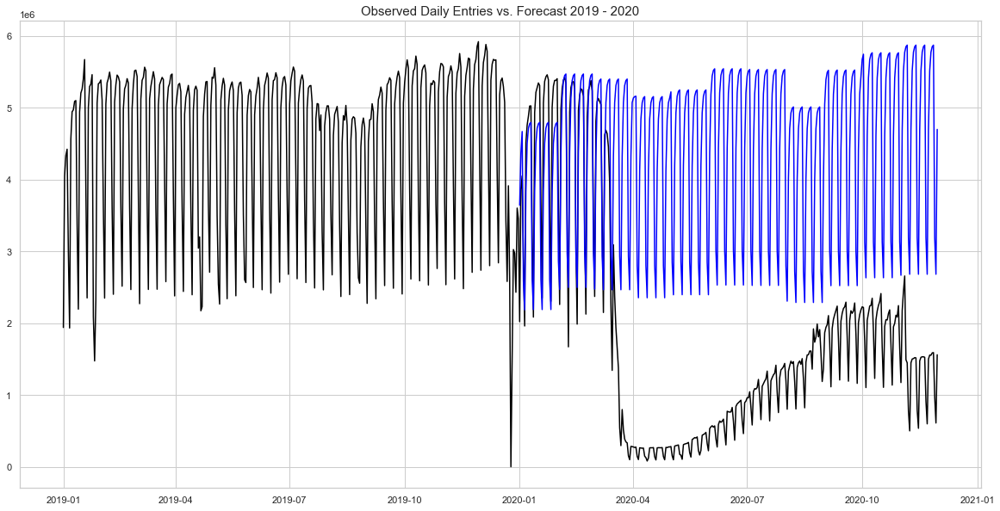

In [144]:
df = rail_ts_la[rail_ts_la['travel_date']>='01/01/2019'].groupby(['travel_date', 'weekday', 'weekend_indicator'])['origin_trips', 'estimate', 'estimate_upper', 'estimate_lower'].agg('sum')
df = pd.DataFrame(df)
df = df.reset_index()

df2 = rail_test_la.groupby(['travel_date', 'weekday', 'weekend_indicator'])['origin_trips', 'estimate', 'estimate2'].agg('sum')
df2 = pd.DataFrame(df2)
df2 = df2.reset_index()


fig, ax = plt.subplots(1, 1, figsize=(20, 10), sharex=False, sharey=False)
plt.plot(df.travel_date, df.origin_trips, color = 'black')
#plt.plot(df.travel_date, df.estimate, color = 'red')
plt.plot(df2.travel_date, df2.estimate2, color = 'blue')
ax.set_title('Observed Daily Entries vs. Forecast 2019 - 2020', fontsize = 15)


C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Text(0.5, 1.0, 'Residuals: Without Westminster')

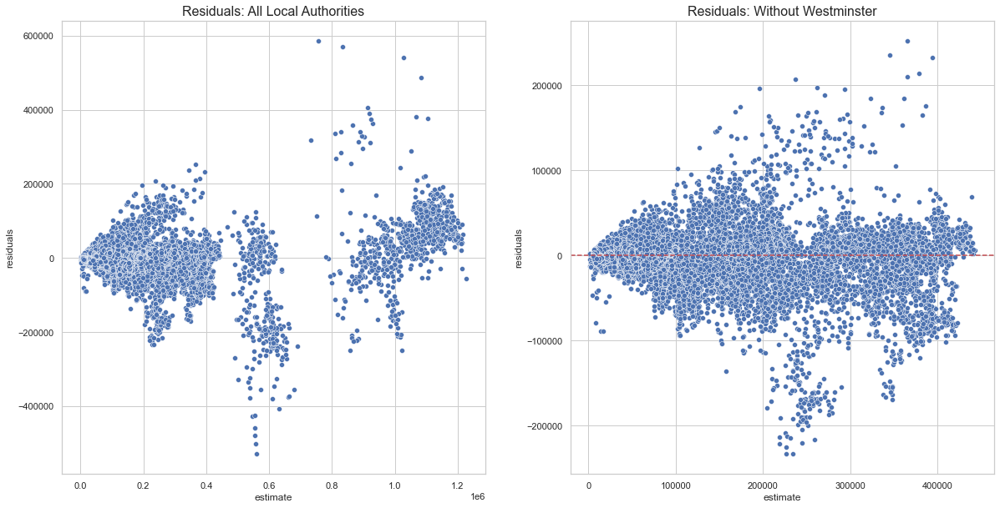

In [145]:
# Plotting of residuals against existing model, not forecasted values.
fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharex=False, sharey=False)
df = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2017')&(rail_ts_la['travel_date']<='12/23/2019')]
df2 = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2017')&(rail_ts_la['travel_date']<='12/23/2019')&(rail_ts_la['la_name']!='Westminster')]
df2['slope'] = df2['estimate']/df['residuals']
sns.scatterplot(x = "estimate", y = "residuals", data = df, ax=ax[0])
sns.scatterplot(x = "estimate", y = "residuals", data = df2, ax=ax[1])#, hue = 'origin_trips', palette = 'hls')
plt.axhline(y=0, color='r', ls='--')
ax[0].set_title('Residuals: All Local Authorities', fontsize = 16)
ax[1].set_title('Residuals: Without Westminster', fontsize = 16)

Text(0.5, 1.0, 'Residuals: Histogram')

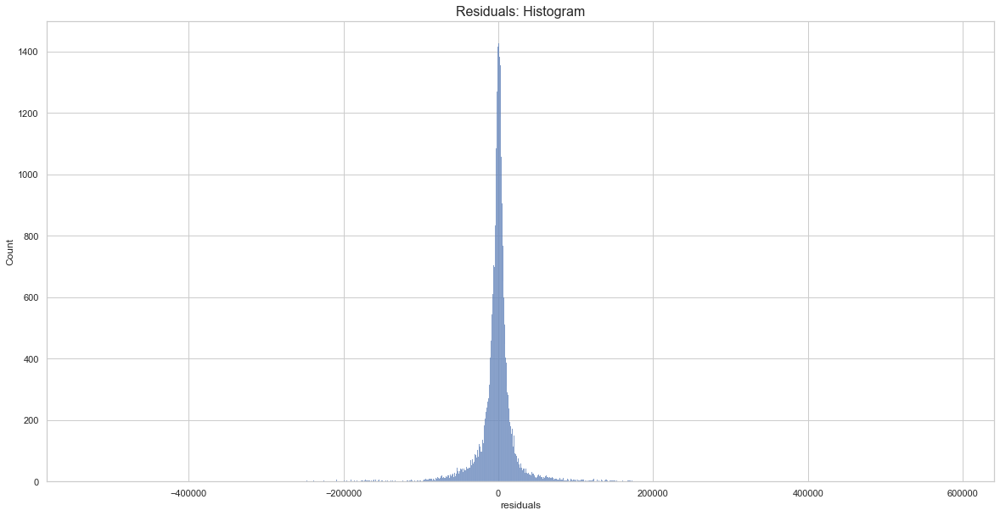

In [146]:
# Histogram of residuals
fig, ax = plt.subplots(1, 1, figsize=(20, 10), sharex=False, sharey=False)
df = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2017')&(rail_ts_la['travel_date']<='12/31/2019')]
df2 = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2017')&(rail_ts_la['travel_date']<='12/31/2019')&(rail_ts_la['la_name']!='Westminster')]
p = sns.histplot(data=df, x='residuals')#, bins = 100)
p.set_title('Residuals: Histogram', fontsize = 16)
#sns.histplot(data=df2, x='residuals', ax = ax[1])#, bins = 100)

In [147]:
# Check for forecast accuracy
# https://www.machinelearningplus.com/vector-autoregression-examples-python/
# Durbin Watson Statistic for serial correlation of errors of model
# https://www.machinelearningplus.com/vector-autoregression-examples-python/

df = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2017')&(rail_ts_la['travel_date']<='12/30/2019')]

res = df['residuals']**2
RMSE = round(sqrt(res.mean()), 3)
MAPE = np.mean(np.abs(df['residuals'])/np.abs(df['origin_trips']))
out = durbin_watson(model_la.resid)

d = {'Forecast Test':['R-Squared','RMSE', 'MAPE', 'Durbin-Watson'], 'Value':[0.886, RMSE, MAPE, out]}
df = pd.DataFrame(d)
df

,Forecast Test,Value
0,R-Squared,0.89
1,RMSE,"32,570.41"
2,MAPE,10.75
3,Durbin-Watson,2.10


In [148]:
trips_2017 = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2017')&(rail_ts_la['travel_date']<='11/30/2017')]['origin_trips'].agg('sum')
trips_2018 = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2018')&(rail_ts_la['travel_date']<='11/30/2018')]['origin_trips'].agg('sum')
trips_2019 = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2019')&(rail_ts_la['travel_date']<='11/30/2019')]['origin_trips'].agg('sum')
trips_2020 = rail_ts_la[(rail_ts_la['travel_date']>='01/01/2020')&(rail_ts_la['travel_date']<='11/30/2020')]['origin_trips'].agg('sum')
trips_est_2020 = rail_test_la[(rail_test_la['travel_date']>='01/01/2020')&(rail_test_la['travel_date']<='11/30/2020')]['estimate2'].agg('sum')

d = {'Trips Jan - Nov':[2017, 2018, 2019, '2020 Forecast', '2020 Actual'], 'Value':[trips_2017,trips_2018, trips_2019, trips_est_2020, trips_2020]}
df = pd.DataFrame(d)
df

,Trips Jan - Nov,Value
0,2017,"1,438,876,853.00"
1,2018,"1,472,497,942.00"
2,2019,"1,519,100,170.00"
3,2020 Forecast,"1,472,553,647.68"
4,2020 Actual,"613,355,401.00"


In [149]:
# Create a Function to build a multivariate timeseries model at LA or MSOA Level

In [ ]:
# Create a function to print model accuracy (residuals, MAPE)

In [ ]:
# Create a function to forecast 2020 trips and plot trend

In [ ]:
# Create a function to plot

#### MSOA Time Series Model

#### Autoregressive Model

<AxesSubplot:xlabel='travel_date'>

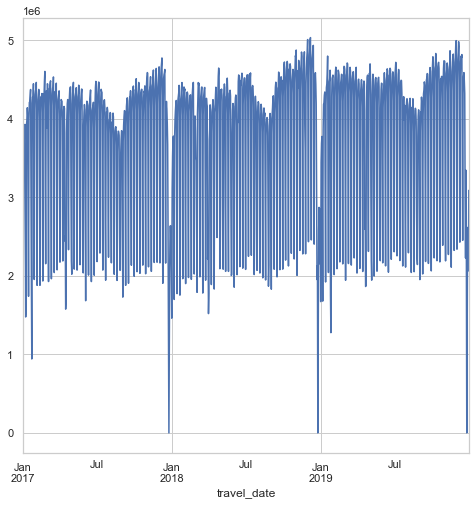

In [387]:
rail_traintest = rail_timeseries[(rail_timeseries['date']>='01/01/2017')&(rail_timeseries['date']<='12/31/2019')]
rail_traintest = rail_traintest.groupby(['month','year', 'travel_date', 'weekday', 'weekend_indicator'])['origin_trips'].agg('sum') #this is where you segment by LA/MSOA..
rail_traintest = pd.DataFrame(rail_traintest)
rail_traintest = rail_traintest.reset_index()
rail_traintest = rail_traintest.set_index('travel_date')
rail_traintest = rail_traintest.origin_trips
rail_traintest = rail_traintest.asfreq('d')
rail_traintest.plot()

In [790]:
rail_traintest.head()

travel_date
2017-01-01   1438107.00
2017-01-02   2044707.00
2017-01-03   3390287.00
2017-01-04   3638261.00
2017-01-05   3817339.00
Freq: D, Name: origin_trips, dtype: float64

In [391]:
# Trying again, but with an autoregression model
# AR Model: https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/
# Another source: https://pythondata.com/forecasting-time-series-autoregression/

modelAR = AutoReg(rail_test_la, seasonal = True, lags = 1).fit()
modelAR.summary()

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\statsmodels\tsa\ar_model.py:252: FutureWarning: The parameter names will change after 0.12 is released. Set old_names to False to use the new names now. Set old_names to True to use the old names. 
  FutureWarning,


<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:           origin_trips   No. Observations:                 1095
Model:               Seas. AutoReg(1)   Log Likelihood              -15645.339
Method:               Conditional MLE   S.D. of innovations         393211.388
Date:                Fri, 18 Jun 2021   AIC                             25.781
Time:                        17:50:38   BIC                             25.822
Sample:                    01-02-2017   HQIC                            25.796
                         - 12-31-2019                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
intercept        1.568e+05   7.91e+04      1.982      0.047    1756.618    3.12e+05
seasonal.1       2.387e+06   5.04e+04     47.391      0.000    2.29e+06    2.49e+06
seasonal.2       1.665e+06   4.81e+04     34.658      0.000    1.57e+06    1.76e+06
seasonal.3       1.512e+06   5.23e+04     28.902      0.000    1.41e+06    1.61e+06
seasonal.4       1.538e+06   5.34e+04     28.814      0.000    1.43e+06    1.64e+06
seasonal.5       1.422e+06   5.44e+04     26.127      0.000    1.31e+06    1.53e+06
seasonal.6       2.139e+05   5.35e+04      3.999      0.000    1.09e+05    3.19e+05
origin_trips.L1     0.6240      0.024     26.314      0.000       0.577       0.670
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.6027           +0.0000j            1.6027            0.0000
-----------------------------------------------------------------------------
"""

<Figure size 2160x720 with 0 Axes>

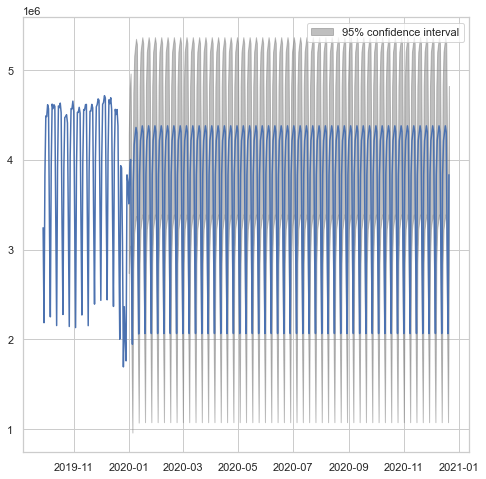

In [800]:
fig = plt.figure(figsize=(30,10))
fig = modelAR.plot_predict(1000,1450)

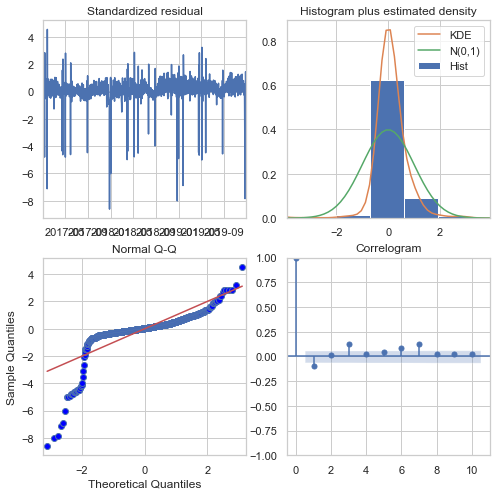

<Figure size 1152x648 with 0 Axes>

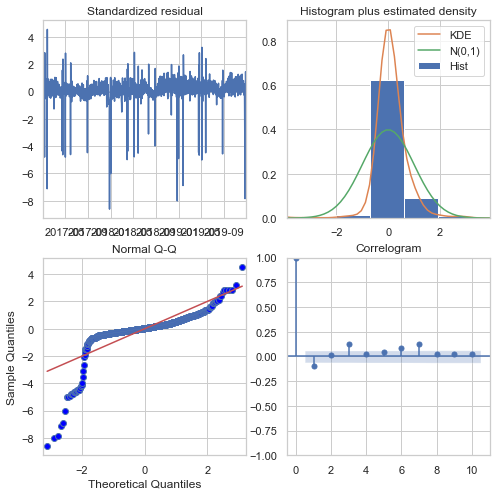

In [801]:
fig = plt.figure(figsize=(16,9))
modelAR.plot_diagnostics()

In [955]:
rail_timeseries.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
DatetimeIndex: 945262 entries, 2015-05-31 to 2020-11-30
Data columns (total 51 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   year                                      945262 non-null  int64         
 1   month                                     945262 non-null  int64         
 2   week                                      945262 non-null  object        
 3   day                                       945262 non-null  int64         
 4   weekday                                   945262 non-null  object        
 5   date                                      945262 non-null  datetime64[ns]
 6   msoa_name                                 945262 non-null  object        
 7   msoa_code                                 945262 non-null  object        
 8   la_name                                   945262 non-null  object     

### Spatial Modelling

Exploratory Analysis
1. Map the data
2. Create a linear model, determine if residuals are not normal or appear spatially distributed
3. Determine spatial correlation in dependent variable


Spatial Weighting & Modelling
1. Construct a spatial weights matrix with spatially lagged variables
2. Evaluate model through R^2, AIC, BIC.
3. Evaluate model through equilibrium impact

In [150]:
#Plot residuals to prove that there is an autocorrelation

# Create subset of data for analysis horizon, join against analysis dataset, join against msoa data to get geography
# Will a spatially lagged model need time in it? For now, we're stripping it out.
# If you strip out time, you need to somehow account for restrictions at different points in time...

#cols = ['msoa_name', 'msoa_code', 'la_name', 'la_code', 'death_rate', 'imd_score', 'number_tubestations', 'pop16_59_pct', 'pop60_pct', 'workpop_pct']

rail_residuals_la = rail_ts_la
# Subesetting analysis dataset so we don't have to write a long key of date columns
rail_residuals_la = rail_residuals_la[(rail_residuals_la['travel_date']>='01/01/2017')&(rail_residuals_la['travel_date']<='12/31/2019')]
rail_residuals_la = rail_residuals_la.groupby(['la_name']).agg({'origin_trips':'sum',
                                                                'estimate':'sum',
                                                                'residuals':'sum'})

rail_residuals_la = rail_residuals_la.reset_index()
rail_residuals_la['pct_error'] = ((rail_residuals_la['estimate']-rail_residuals_la['origin_trips'])/rail_residuals_la['origin_trips'])

# Adding back geometry
rail_residuals_la = rail_residuals_la.merge(boroughs, left_on = ['la_name'], right_on = ['NAME'])
rail_residuals_la = rail_residuals_la[['la_name', 'geometry', 'origin_trips', 'estimate','residuals', 'pct_error']]
rail_residuals_la = gpd.GeoDataFrame(rail_residuals_la, geometry = 'geometry')

rail_residuals_la

,la_name,geometry,origin_trips,estimate,residuals,pct_error
0,Barking and Dagenham,"MULTIPOLYGON (((543905.400 183199.100, 543905....",48046348,"47,536,099.00","-510,249.00",-0.01
1,Barnet,"POLYGON ((524579.900 198355.200, 524594.300 19...",88976713,"87,526,520.00","-1,450,193.00",-0.02
2,Bexley,"POLYGON ((547226.200 181299.300, 547320.900 18...",14791678,"13,097,110.00","-1,694,568.00",-0.11
3,Brent,"POLYGON ((525201.000 182512.600, 525181.500 18...",137300522,"138,141,582.00","841,060.00",0.01
4,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15...",33471771,"32,247,988.00","-1,223,783.00",-0.04
5,Camden,"POLYGON ((528840.200 187217.800, 528834.600 18...",361109403,"358,664,985.00","-2,444,418.00",-0.01
6,City of London,"POLYGON ((531145.100 180782.100, 531143.800 18...",355078678,"321,402,842.00","-33,675,836.00",-0.09
7,Croydon,"POLYGON ((535009.200 159504.700, 535005.500 15...",55692290,"54,453,516.00","-1,238,774.00",-0.02
8,Ealing,"POLYGON ((510253.500 182881.600, 510249.900 18...",95846759,"95,474,082.00","-372,677.00",-0.00
9,Enfield,"POLYGON ((531023.500 200933.600, 531039.900 20...",45896744,"44,838,172.00","-1,058,572.00",-0.02


In [151]:
#df = rail_residuals_la[rail_residuals_la['residuals']<0]

#df['la_name'].agg('count')

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\geopandas\plotting.py:568: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  FutureWarning,


Text(0.5, 0.98, 'Residuals')

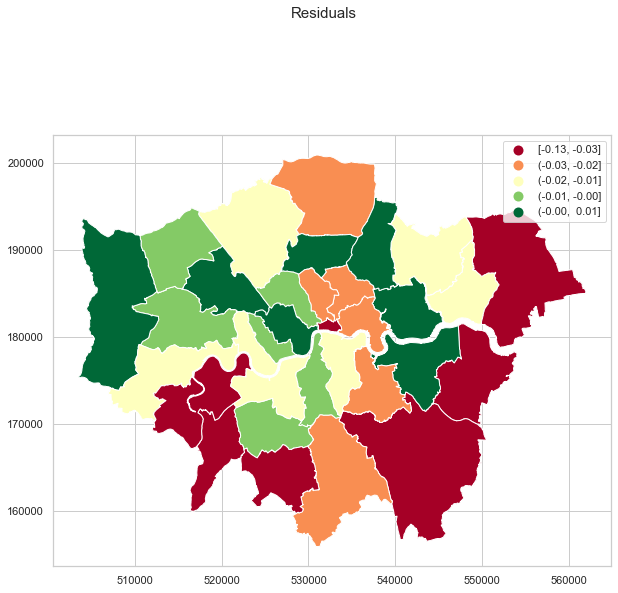

In [152]:
# Plot differences, should we normalise it?

f,ax = plt.subplots(1, 1, figsize = (10,10))

df = rail_residuals_la

plotmsoa = msoas.plot(axes=ax,alpha=0.8,color='gainsboro')
plotresid = df.plot(column='pct_error', ax=ax, cmap = 'RdYlGn',legend = True, scheme = 'quantiles')
                                                                        

f.suptitle('Residuals', fontsize=15)

In [153]:
# Create subset of data for analysis horizon, join against analysis dataset, join against msoa data to get geography
# Create a timeseries one and an aggergate one

# Aggregate dataset
df = rail_test_la[(rail_test_la['travel_date']>='03/24/2020')&(rail_test_la['travel_date']<='09/13/2020')]
df = df.groupby(['la_name', 'la_code']).agg({'origin_trips':'sum',
                                            'destination_trips':'sum',
                                            'number_tubestations':'mean',
                                            'log_origin_trips':'sum',
                                            'log_destination_trips':'sum',
                                            'lag_origin':'sum',
                                            'lag_logorigin':'sum',
                                            'estimate':'sum',
                                            'estimate_upper':'sum',
                                            'estimate_lower':'sum',
                                            'residuals':'sum',
                                            'lag_origin2':'sum',
                                            'estimate2':'sum',
                                            'residuals2':'sum'}).reset_index()
# Calculate Origin Trips by Estimate2
df['delta'] = df['origin_trips']-df['estimate2']
df['pct_diff'] = df['origin_trips']/df['estimate2']

# Get Geography
df = df.merge(boroughs, left_on = ['la_code'], right_on = ['GSS_CODE'])
df = df[['la_name',
         'la_code',
         'geometry',
         'origin_trips',
         'destination_trips',
         'number_tubestations',
         'log_origin_trips',
         'log_destination_trips',
         'lag_origin',
         'lag_logorigin',
         'estimate',
         'estimate_upper',
         'estimate_lower',
         'residuals',
         'lag_origin2',
         'estimate2',
         'residuals2',
         'delta',
         'pct_diff']]
df = gpd.GeoDataFrame(df, geometry = 'geometry')

rail_model_la = df

In [154]:
# Sanity checking percent diff against Covid-10-transport-use statistics.
# Aggregate dataset
df = rail_test_la[(rail_test_la['travel_date']>='03/24/2020')&(rail_test_la['travel_date']<='09/13/2020')]
df = df.groupby(['travel_date']).agg({'origin_trips':'sum',
                                            'destination_trips':'sum',
                                            'number_tubestations':'mean',
                                            'log_origin_trips':'sum',
                                            'log_destination_trips':'sum',
                                            'lag_origin':'sum',
                                            'lag_logorigin':'sum',
                                            'estimate':'sum',
                                            'estimate_upper':'sum',
                                            'estimate_lower':'sum',
                                            'residuals':'sum',
                                            'lag_origin2':'sum',
                                            'estimate2':'sum',
                                            'residuals2':'sum'}).reset_index()
# Calculate Origin Trips by Estimate2
df['delta'] = df['origin_trips']-df['estimate2']
df['pct_diff'] = df['origin_trips']/df['estimate2']

df[['travel_date','origin_trips','estimate2','pct_diff']][150:200]


,travel_date,origin_trips,estimate2,pct_diff
150,2020-08-21,1611971,"5,011,180.57",0.32
151,2020-08-22,1359643,"2,723,485.37",0.50
152,2020-08-23,1920660,"2,287,961.29",0.84
153,2020-08-24,1734941,"4,009,608.34",0.43
154,2020-08-25,1806301,"4,706,856.15",0.38
155,2020-08-26,1988756,"4,927,525.12",0.40
156,2020-08-27,1809293,"4,992,465.71",0.36
157,2020-08-28,1910547,"5,011,180.57",0.38
158,2020-08-29,1586824,"2,723,485.37",0.58
159,2020-08-30,1187760,"2,287,961.29",0.52


In [337]:
# Create a counter for days to join against the rail_test_la dataframe

df = rail_test_la[(rail_test_la['travel_date']>='03/23/2020')&(rail_test_la['travel_date']<='12/01/2020')]
df = df['travel_date'].unique()
df = pd.DataFrame(df)
df.rename(columns = {0:'travel_date'}, inplace = True)

df['days'] = 0
df = df.sort_values(by=['travel_date'])

# For loop to calculate number of days in the analysis
for j in range(0, len(df)):
    if (j==0):
        df.iloc[j, len(df.columns)-1] = 0
    else:
        df.iloc[j, len(df.columns)-1] = df.iloc[j-1, len(df.columns)-1] + 1

days_map = df
days_map

,travel_date,days
0,2020-03-23,0
1,2020-03-24,1
2,2020-03-25,2
3,2020-03-26,3
4,2020-03-27,4
...,...,...
248,2020-11-26,248
249,2020-11-27,249
250,2020-11-28,250
251,2020-11-29,251


In [347]:
# Timeseries dataset
df = rail_test_la[(rail_test_la['travel_date']>='03/24/2020')&(rail_test_la['travel_date']<='09/14/2020')]
df = df.groupby(['travel_date', 'year', 'month', 'weekday', 'weekend', 'la_name', 'la_code']).agg({'origin_trips':'sum',
                                            'destination_trips':'sum',
                                            'number_tubestations':'mean',
                                            'log_origin_trips':'sum',
                                            'log_destination_trips':'sum',
                                            'lag_origin':'sum',
                                            'lag_logorigin':'sum',
                                            'estimate':'sum',
                                            'estimate_upper':'sum',
                                            'estimate_lower':'sum',
                                            'residuals':'sum',
                                            'lag_origin2':'sum',
                                            'estimate2':'sum',
                                            'residuals2':'sum'}).reset_index()

# Calculate Origin Trips by Estimate2
df['delta'] = df['origin_trips']-df['estimate2']
df['pct_diff'] = df['origin_trips']/df['estimate2']
df['log_pctdiff'] = np.log(df['pct_diff'])
df = df.merge(days_map, left_on = 'travel_date', right_on = 'travel_date')

# Get Geography
df = df.merge(boroughs, left_on = ['la_code'], right_on = ['GSS_CODE'])
df = df[['travel_date',
         'year',
         'month',
         'weekday',
         'weekend',
         'la_name',
         'la_code',
         'geometry',
         'origin_trips',
         'destination_trips',
         'number_tubestations',
         'log_origin_trips',
         'log_destination_trips',
         'lag_origin',
         'lag_logorigin',
         'estimate',
         'estimate_upper',
         'estimate_lower',
         'residuals',
         'lag_origin2',
         'estimate2',
         'residuals2',
         'delta',
         'pct_diff',
         'log_pctdiff',
         'days']]
df = gpd.GeoDataFrame(df, geometry = 'geometry')


rail_modelts_la = df

Text(0.5, 1.0, '% Actual v. Forecast All Local Authorities')

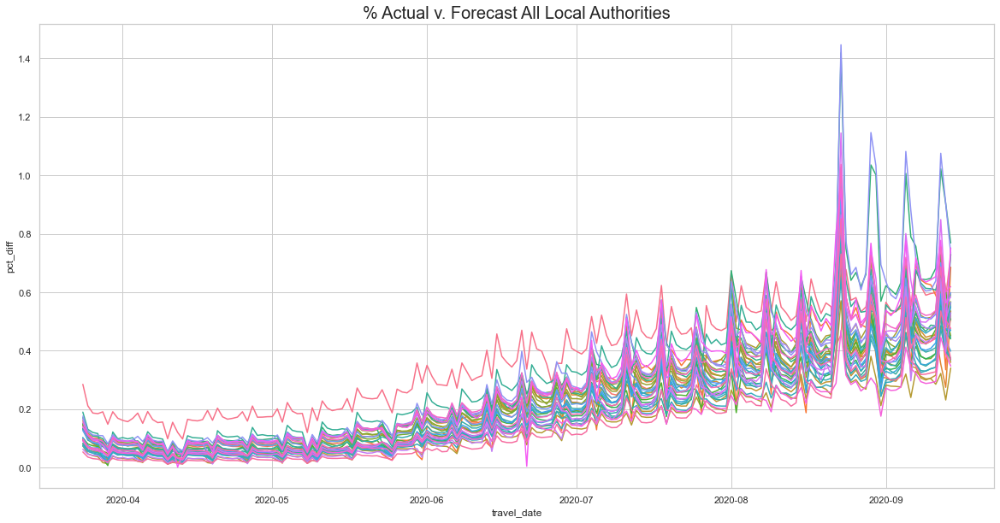

In [349]:
df = rail_modelts_la

fig, ax = plt.subplots(1, 1, figsize=(20, 10), sharex=False, sharey=False)
p = sns.lineplot(x='travel_date', y='pct_diff', data = df, hue='la_name', legend = False)#, ax=ax[0])
p.set_title("% Actual v. Forecast All Local Authorities", fontsize = 20)

In [354]:
df = rail_modelts_la
#df = df.groupby('travel_date')['origin_trips'].agg('sum')
df = df[['travel_date', 'la_name', 'pct_diff']]
df = df.set_index('travel_date')
#df = pd.DataFrame(df)
df

,la_name,pct_diff
travel_date,,
2020-03-24,Barking and Dagenham,0.29
2020-03-25,Barking and Dagenham,0.21
2020-03-26,Barking and Dagenham,0.19
2020-03-27,Barking and Dagenham,0.19
2020-03-28,Barking and Dagenham,0.19
...,...,...
2020-09-10,Westminster,0.32
2020-09-11,Westminster,0.33
2020-09-12,Westminster,0.54


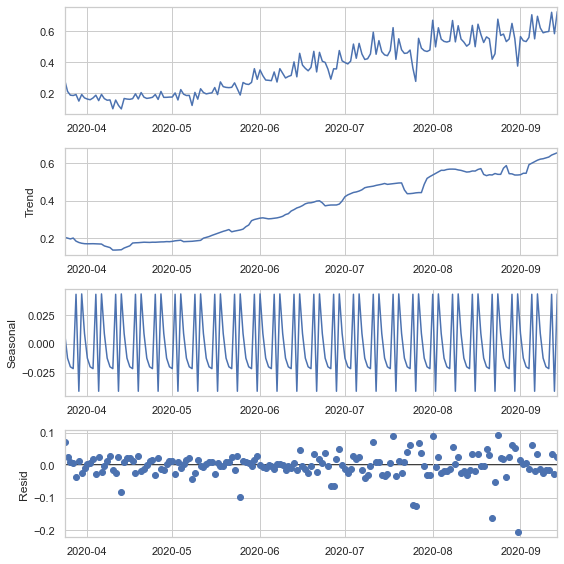

In [356]:
rcParams['figure.figsize'] = 8, 8


df = rail_modelts_la[rail_modelts_la['la_name']=='Barking and Dagenham']
df = df[['travel_date', 'pct_diff']]
df = df.set_index('travel_date')
#df = pd.DataFrame(df)
df 


decomposition = sm.tsa.seasonal_decompose(df, model = 'additive', extrapolate_trend = 'freq')
fig = decomposition.plot()
plt.show()

In [357]:
decomposition.trend

travel_date
2020-03-24   0.20
2020-03-25   0.20
2020-03-26   0.20
2020-03-27   0.20
2020-03-28   0.18
             ... 
2020-09-10   0.63
2020-09-11   0.63
2020-09-12   0.64
2020-09-13   0.65
2020-09-14   0.66
Name: trend, Length: 175, dtype: float64

In [358]:
df_bd = pd.DataFrame(decomposition.trend)
df_bd = df_bd.reset_index()
df_bd = df_bd.merge(days_map, how = 'left', left_on = 'travel_date', right_on = 'travel_date')

#df_bd
model_test = sm.formula.ols('trend ~ days', data=df_bd).fit()
model_test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  trend   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     3359.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          2.99e-115
Time:                        18:06:06   Log-Likelihood:                 336.02
No. Observations:                 175   AIC:                            -668.0
Df Residuals:                     173   BIC:                            -661.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0947      0.005     17.492      0.000       0.084       0.105
days           0.0031   5.34e-05     57.960      0.000       0.003       0.003
==============================================================================
Omnibus:                        5.886   Durbin-Watson:                   0.074
Prob(Omnibus):                  0.053   Jarque-Bera (JB):                5.931
Skew:                           0.419   Prob(JB):                       0.0515
Kurtosis:                       2.666   Cond. No.                         204.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

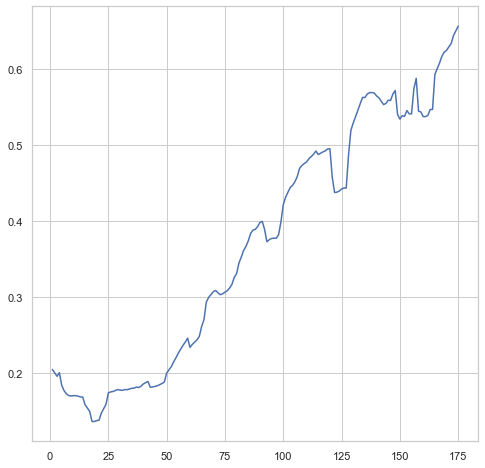

In [359]:
trend = np.array(df_bd['trend'])
days = np.array(df_bd['days'])

slope,intercept = np.polyfit(days, trend, 1)
#slope
plt.plot(days, trend)
#plt.plot(days, slope*days + intercept)

In [361]:
slope

0.0023147322036723094

In [372]:
# Code references:
# how to extract trend from decomposed model: https://mlforanalytics.com/2020/05/29/decomposing-time-series-financial-analytics/

pd.options.display.float_format = '{:,.4f}'.format

localauth = rail_modelts_la[['la_name']].drop_duplicates()
localauth = np.array(localauth)
localauthcode = rail_modelts_la[['la_code']].drop_duplicates()
localauthcode = np.array(localauthcode)


df_slope = []
df_slope = pd.DataFrame(df_slope)
df_slope['la_name'] = 0
df_slope['la_code'] = 0
df_slope['slope'] = 0
df_slope['pct_change'] = 0
df_slope['slope2'] = 0
df_decompose = []

for i in range(0,len(localauth)):
    # Create a dataframe for each local authority
    df = rail_modelts_la[rail_modelts_la['la_name']==localauth[i].item()]
    #df = df.groupby('travel_date')['origin_trips'].agg('sum')
    #df = pd.DataFrame(df)
    df = df[['travel_date', 'pct_diff']]
    df = df.set_index('travel_date')
    # Decompose the trend of origin trips
    decomposition = sm.tsa.seasonal_decompose(df, model = 'additive', extrapolate_trend = 'freq')
    df_trend = pd.DataFrame(decomposition.trend)
    df_trend = df_trend.reset_index()
    df_trend = df_trend.merge(days_map, how = 'left', left_on = 'travel_date', right_on = 'travel_date')
    # Create a dataframe of the trend
    # Calculate the slope of the trend
    trend = np.array(df_trend['trend'])
    days = np.array(df_trend['days'])
    slope,intercept = np.polyfit(days, trend, 1)
    # Store the local authority name and slope in a dataframe, total rows should be 33
    df_slope.loc[i,'la_name'] = localauth[i].item()
    df_slope.loc[i,'la_code'] = localauthcode[i].item()
    df_slope.loc[i,'slope'] = slope
    pct_change = ((df_trend.iloc[len(df_trend)-1,1] - df_trend.iloc[0,1])/df1.iloc[0,1])
    df_slope.loc[i,'pct_change'] = pct_change
    df_slope.loc[i,'slope2'] = pct_change/(len(df_trend)-1)

df_slope

,la_name,la_code,slope,pct_change,slope2
0,Barking and Dagenham,E09000002,0.0031,5.5144,0.0317
1,Barnet,E09000003,0.0028,5.2409,0.0301
2,Bexley,E09000004,0.0034,6.5857,0.0378
3,Brent,E09000005,0.0028,3.8737,0.0223
4,Bromley,E09000006,0.0029,5.5064,0.0316
5,Camden,E09000007,0.0023,3.6776,0.0211
6,City of London,E09000001,0.0020,3.2969,0.0189
7,Croydon,E09000008,0.0033,6.0033,0.0345
8,Ealing,E09000009,0.0029,4.9716,0.0286
9,Enfield,E09000010,0.0029,5.3491,0.0307


C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\geopandas\plotting.py:568: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  FutureWarning,


Text(0.5, 0.98, 'Slope of Percent Difference from 2020 Predicted Trips')

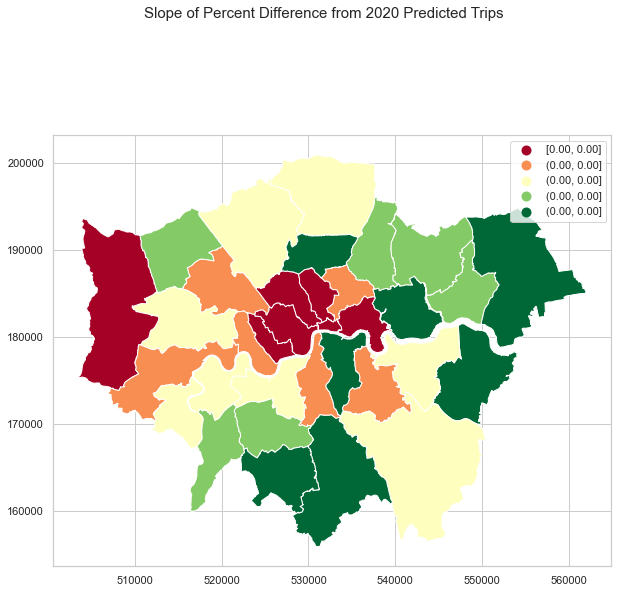

In [377]:
# Plot differences, should we normalise it?
pd.options.display.float_format = '{:,.4f}'.format

f,ax = plt.subplots(1, 1, figsize = (10,10))

df = df_slope
df = df_slope.merge(boroughs, left_on = ['la_code'], right_on = ['GSS_CODE'])
df = gpd.GeoDataFrame(df, crs = 'epsg:27700')

plotmsoa = msoas.plot(axes=ax,alpha=0.8,color='gainsboro')
plotresid = df.plot(column='slope', ax=ax, cmap = 'RdYlGn',legend = True, scheme = 'quantiles')
                                                                        

f.suptitle('Slope of Percent Difference from 2020 Predicted Trips', fontsize=15)

In [381]:
os.chdir('\\Users\\TBD\\Documents\\Education\\UCL\\CASA 0002\\week1\\Dissertation\\output_data\\')

df.to_csv('slope_la.csv',index=False)

<AxesSubplot:xlabel='travel_date', ylabel='slope'>

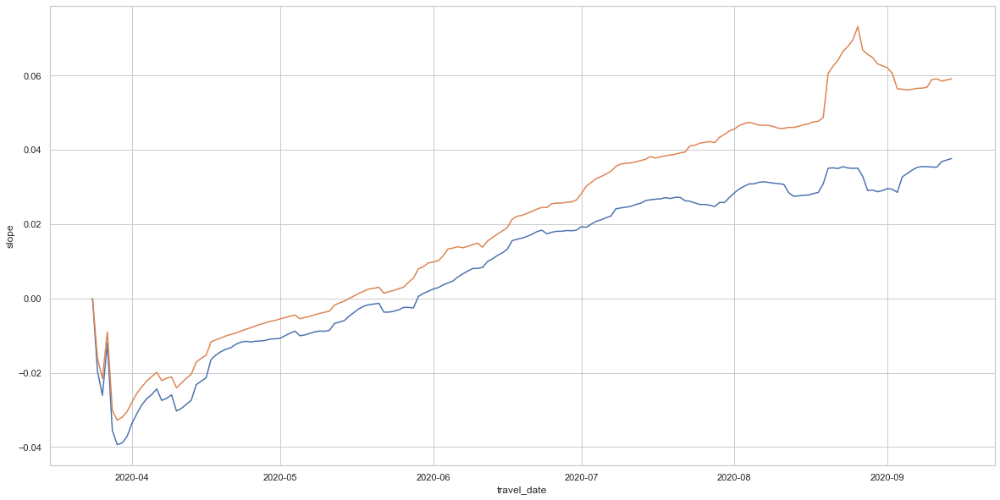

In [370]:
df1 = rail_modelts_la[rail_modelts_la['la_name'] == 'Bexley']
#df1 = df1.groupby('travel_date')['origin_trips'].agg('sum')
#df1 = pd.DataFrame(df1)
df1 = df1[['travel_date', 'pct_diff']]
df1 = df1.set_index('travel_date')
decomposition = sm.tsa.seasonal_decompose(df1, model = 'additive', extrapolate_trend = 'freq')
df1 = pd.DataFrame(decomposition.trend)
df1 = df1.reset_index()
df1 = df1.merge(days_map, how = 'left', left_on = 'travel_date', right_on = 'travel_date')
df1['trend_0'] = df1.iloc[0,1]
df1['trenddays_0'] = df1['trend'] - df1['trend_0']
df1['pct_change'] = df1['trenddays_0']/df1['trend_0']
df1['slope'] = df1['pct_change']/df1['days']

df2 = rail_modelts_la[rail_modelts_la['la_name'] == 'Westminster']
#df2 = df2.groupby('travel_date')['origin_trips'].agg('sum')
#df2 = pd.DataFrame(df2)
df2 = df2[['travel_date', 'pct_diff']]
df2 = df2.set_index('travel_date')
decomposition = sm.tsa.seasonal_decompose(df2, model = 'additive', extrapolate_trend = 'freq')
df2 = pd.DataFrame(decomposition.trend)
df2 = df2.reset_index()
df2 = df2.merge(days_map, how = 'left', left_on = 'travel_date', right_on = 'travel_date')
df2['trend_0'] = df2.iloc[0,1]
df2['trenddays_0'] = df2['trend'] - df2['trend_0']
df2['pct_change'] = df2['trenddays_0']/df2['trend_0']
df2['slope'] = df2['pct_change']/df2['days']
    
fig, ax = plt.subplots(1, 1, figsize=(20, 10), sharex=False, sharey=False)
sns.lineplot(x='travel_date', y='slope', data = df1, legend = True)#, ax=ax[0])
sns.lineplot(x='travel_date', y='slope', data = df2, legend = True)#, ax=ax[0])
#sns.lineplot(x='travel_date', y='pct_diff', data = df2, hue='la_name', legend = True)
#p.set_title("% Actual v. Forecast All Local Authorities", fontsize = 20)

In [304]:
#print(((df1.iloc[176,1] - df1.iloc[0,1])/df1.iloc[0,1])/175)
print((df2.iloc[175,1] - df2.iloc[0,1])/df2.iloc[0,1])
print(df2.iloc[175,1])
print(df2.iloc[0,1])

6.9739938390262415
352940.84693877574
44261.48979591834


In [371]:
df2#[150:165]

,travel_date,trend,days,trend_0,trenddays_0,pct_change,slope
0,2020-03-24,0.0341,1,0.0341,0.0000,0.0000,0.0000
1,2020-03-25,0.0330,2,0.0341,-0.0011,-0.0323,-0.0162
2,2020-03-26,0.0319,3,0.0341,-0.0022,-0.0646,-0.0215
3,2020-03-27,0.0328,4,0.0341,-0.0012,-0.0361,-0.0090
4,2020-03-28,0.0289,5,0.0341,-0.0051,-0.1505,-0.0301
...,...,...,...,...,...,...,...
170,2020-09-10,0.3771,171,0.0341,0.3431,10.0685,0.0589
171,2020-09-11,0.3803,172,0.0341,0.3463,10.1621,0.0591
172,2020-09-12,0.3785,173,0.0341,0.3445,10.1092,0.0584
173,2020-09-13,0.3824,174,0.0341,0.3483,10.2233,0.0588


In [282]:
model_test = sm.formula.ols('trend ~ days', data=df2).fit()
model_test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  trend   R-squared:                       0.895
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     1476.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):           6.47e-87
Time:                        16:24:53   Log-Likelihood:                -2086.8
No. Observations:                 176   AIC:                             4178.
Df Residuals:                     174   BIC:                             4184.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -4.596e+04   5151.248     -8.922      0.000   -5.61e+04   -3.58e+04
days        1955.9725     50.911     38.419      0.000    1855.489    2056.456
==============================================================================
Omnibus:                       19.198   Durbin-Watson:                   0.012
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.622
Skew:                           0.764   Prob(JB):                     5.48e-05
Kurtosis:                       2.414   Cond. No.                         202.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [986]:
df = rail_modelts_la[rail_modelts_la['la_name']=='Barking and Dagenham']
model_test = sm.formula.ols('log_pctdiff ~ days', data=df).fit()
model_test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_pctdiff   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     858.2
Date:                Thu, 01 Jul 2021   Prob (F-statistic):           3.55e-69
Time:                        13:14:25   Log-Likelihood:                 28.127
No. Observations:                 176   AIC:                            -52.25
Df Residuals:                     174   BIC:                            -45.91
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9057      0.031    -61.206      0.000      -1.967      -1.844
days           0.0090      0.000     29.296      0.000       0.008       0.010
==============================================================================
Omnibus:                       42.899   Durbin-Watson:                   0.964
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              253.424
Skew:                           0.697   Prob(JB):                     9.33e-56
Kurtosis:                       8.711   Cond. No.                         202.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0.5, 1.0, 'Logged Percent Difference')

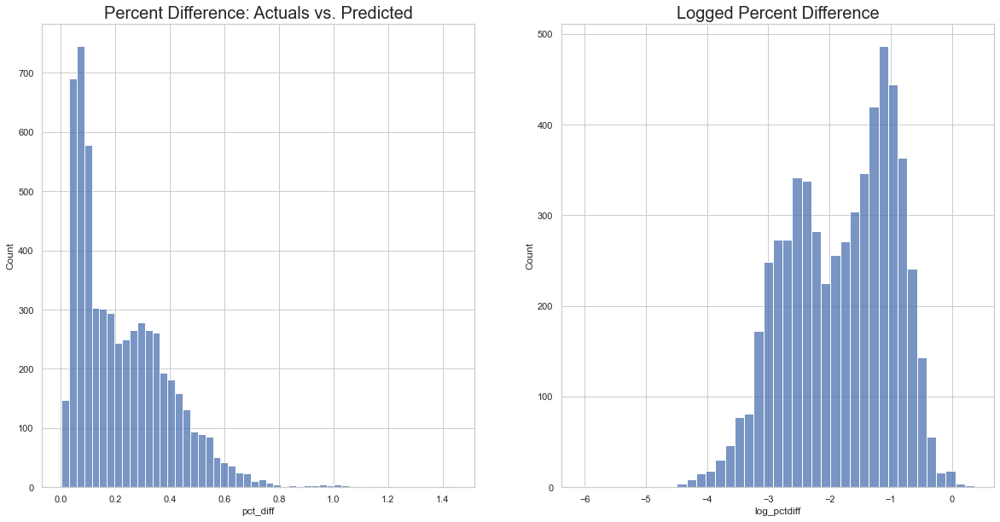

In [925]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharex=False, sharey=False)

p = sns.histplot(data=rail_modelts_la, x='pct_diff', ax=ax[0])
q = sns.histplot(data=rail_modelts_la, x='log_pctdiff', ax=ax[1])
p.set_title("Percent Difference: Actuals vs. Predicted", fontsize = 20)
q.set_title("Logged Percent Difference", fontsize = 20)

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\geopandas\plotting.py:568: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  FutureWarning,


Text(0.5, 0.98, 'Covid Wave One: Pct: Actual/Forecast Trips')

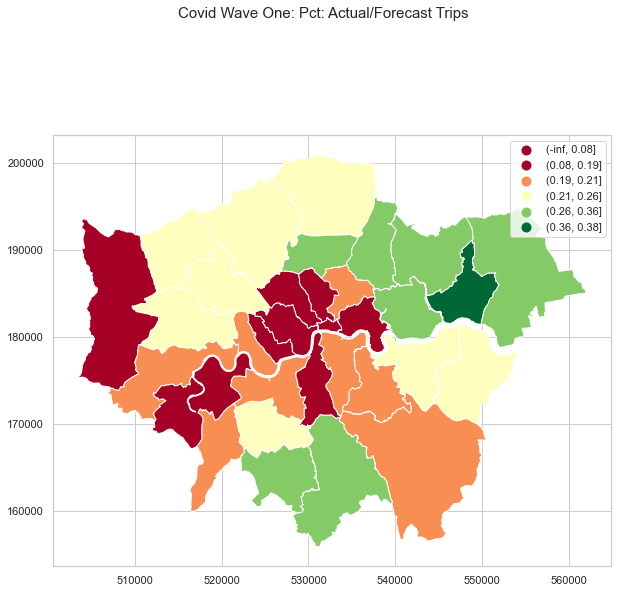

In [659]:
# Plot differences, should we normalise it?

f,ax = plt.subplots(1, 1, figsize = (10,10))

df = rail_model_la

plotmsoa = msoas.plot(axes=ax,alpha=0.8,color='gainsboro')
plotdiff = df.plot(column='pct_diff', ax=ax, cmap = 'RdYlGn',legend = True, scheme = 'box_plot')
                                                                        

f.suptitle('Covid Wave One: Pct: Actual/Forecast Trips', fontsize=15)

#### Build time series dataset for multivariate modelling to validate spatial autocorrelation

In [158]:
imd_la

,FID,lad19cd,lad19nm,RAvgRank,RAvgScor,RPLMD10,Shape__Area,Shape__Length
0,1,E06000001,Hartlepool,25,10,10,"279,574,676.34","120,551.65"
1,2,E06000002,Middlesbrough,16,5,1,"159,856,037.39","72,792.85"
2,3,E06000003,Redcar and Cleveland,62,40,29,"726,874,697.17","166,333.28"
3,4,E06000004,Stockton-on-Tees,113,73,39,"608,710,620.90","199,133.02"
4,5,E06000010,"Kingston upon Hull, City of",9,4,4,"204,197,334.85","107,476.56"
...,...,...,...,...,...,...,...,...
312,313,E09000027,Richmond upon Thames,297,295,195,"147,524,302.57","106,727.71"
313,314,E09000028,Southwark,43,72,147,"74,234,677.94","53,446.03"
314,315,E09000029,Sutton,227,226,188,"112,316,762.63","62,543.64"
315,316,E09000030,Tower Hamlets,27,50,175,"51,019,215.36","43,838.55"


In [483]:
# Add in new attributes: IMD, Covid Deaths, Restrictions, Population, other POIs
# First, we'll do this at a time series level, then after an OLS, determine the right aggregate level to check it out.
# Add dummy variables for month
# Need to decide if we add days since restrictions 

# IMD (technically, IMD is at an LSOA level), so first we'll aggregate IMD to LA

imd_la2 = imd.groupby(['LADcd', 'LADnm']).agg({'IMD_Rank':'mean',
                                             'IMD_Decile':'mean',
                                             'IMDScore':'mean',
                                             'IMDRank0':'mean',
                                             'IMDDec0':'mean',
                                             'TotPop':'sum',
                                             'Pop16_59':'sum',
                                             'Pop60_':'sum',
                                             'WorkPop':'sum'}).reset_index()

df = rail_model_la 
df = df.merge(imd_la2, left_on = 'la_code', right_on = 'LADcd')

# Covid Deaths -- need to get this at a cumulative level
#coviddeaths['date'] = pd.to_datetime(coviddeaths['date'])
#df = df.merge(coviddeaths, how = 'left', left_on = ['la_code', 'travel_date'], right_on = ['areaCode', 'date'])

# Covid Restrictions, guess we won't have this unless we break up the data into stages.
#covidrestrictions['date'] = pd.to_datetime(covidrestrictions['date'])
#covidrestrictions['number_restrictions'] = covidrestrictions['schools_closed'] + covidrestrictions['pubs_closed'] + covidrestrictions['shops_closed'] + covidrestrictions['eating_places_closed'] + covidrestrictions['stay_at_home'] + covidrestrictions['wfh'] + covidrestrictions['rule_of_6_indoors'] + covidrestrictions['curfew']
#df = df.merge(covidrestrictions, how='left', left_on = 'travel_date', right_on = 'date')

# Rename columns

df.rename(columns = {'IMD_Rank':"imd_rank",
                     "IMD_Decile":"imd_decile",
                     'IMDScore':'imd_score',
                     'IMDRank0':'imd_rank0',
                     'IMDDec0':'imd_dec0',
                     'TotPop':'tot_pop',
                     'Pop16_59':'pop16_59',
                     'Pop60_':'pop60',
                     'WorkPop':'workpop',
                     'newDeaths28DaysByDeathDateRate':'covid_deathrate'}, inplace = True)

# Log of pct diff given the skewed data
df['log_pctdiff'] = np.log(df['pct_diff'])

# Population Percentage
df['pop16_59_pct'] = df['pop16_59']/df['tot_pop']
df['pop60_pct'] = df['pop60']/df['tot_pop']
df['workpop_pct'] = df['workpop']/df['tot_pop']

# Dummy for Month, can't have a dummy for time
#dummies = pd.get_dummies(df['month'], prefix = 'month_', drop_first=True) #dropping a column because 'dummy trap'
#df = pd.concat([df, dummies], axis = 1)

rail_model_la = df

Text(0.5, 1.0, 'Logged Percent Difference')

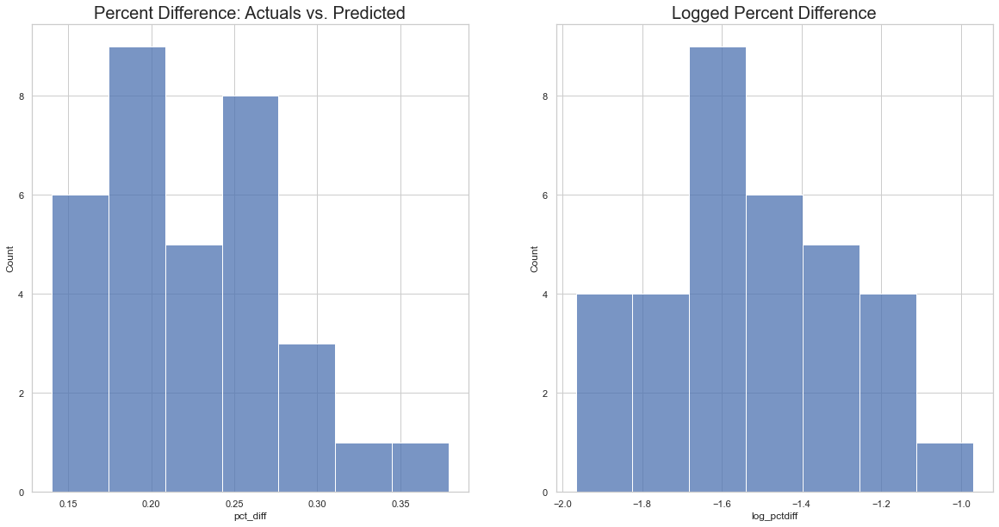

In [485]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharex=False, sharey=False)

p = sns.histplot(data=rail_model_la, x='pct_diff', ax=ax[0])
q = sns.histplot(data=rail_model_la, x='log_pctdiff', ax=ax[1])
p.set_title("Percent Difference: Actuals vs. Predicted", fontsize = 20)
q.set_title("Logged Percent Difference", fontsize = 20)

In [546]:

# Time Series Model
df = rail_model_la[['log_pctdiff',
                    'number_tubestations',
                    'imd_score', 
                    'workpop_pct']]

columns = df.iloc[:, 2:df.shape[1]]
#columns


In [547]:
df

,log_pctdiff,number_tubestations,imd_score,workpop_pct
0,-0.97,5.90,32.88,0.59
1,-1.46,18.05,15.95,0.61
2,-1.40,10.67,15.88,0.58
3,-1.39,23.81,25.20,0.63
4,-1.58,25.37,13.97,0.58
5,-1.77,24.51,19.98,0.68
6,-1.97,13.45,14.80,0.63
7,-1.29,16.71,21.96,0.60
8,-1.41,22.88,22.55,0.62
9,-1.40,21.44,25.40,0.60


In [ ]:
g = sns.FacetGrid(df, col="weekday")
g.map(sns.scatterplot, "destination_trips")

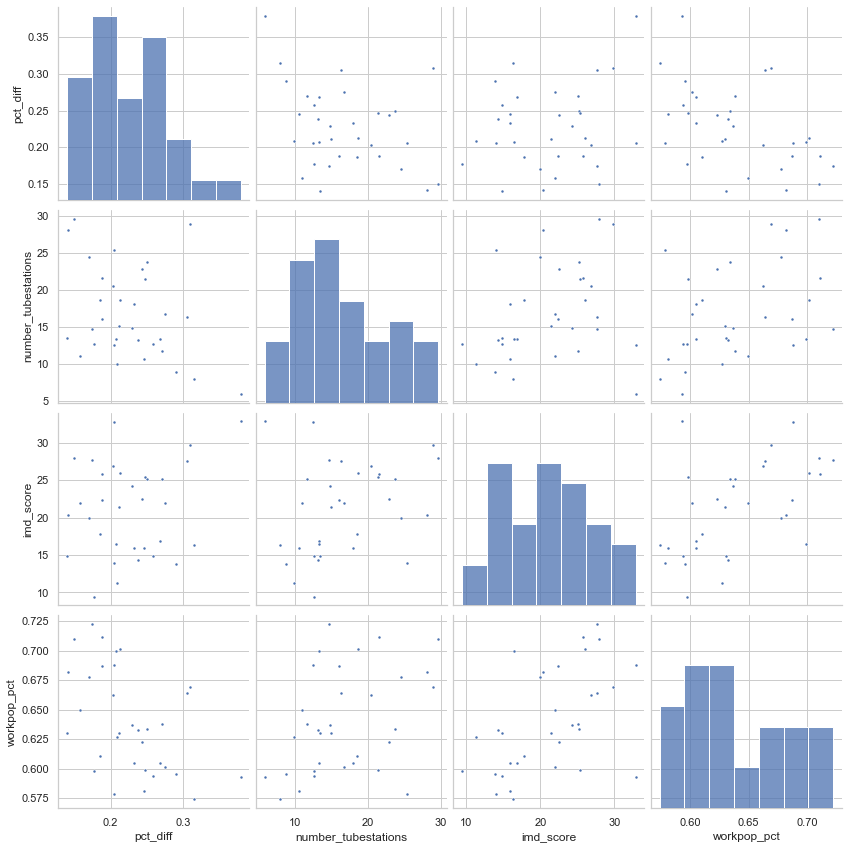

In [508]:
cols_to_plot = ['pct_diff',
                'number_tubestations',
                'imd_score', 
                'workpop_pct']

sns.pairplot(df, vars=cols_to_plot, markers=".", height=3)

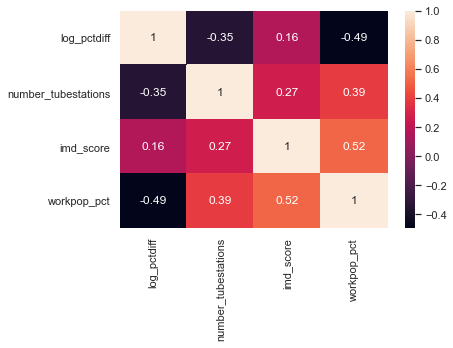

In [548]:
corrMatrix = df.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()


In [549]:
model_la_20 = sm.formula.ols('log_pctdiff ~ number_tubestations + imd_score + workpop_pct', data=df).fit()
model_la_20.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_pctdiff   R-squared:                       0.530
Model:                            OLS   Adj. R-squared:                  0.481
Method:                 Least Squares   F-statistic:                     10.88
Date:                Tue, 29 Jun 2021   Prob (F-statistic):           5.88e-05
Time:                        17:53:47   Log-Likelihood:                 12.948
No. Observations:                  33   AIC:                            -17.90
Df Residuals:                      29   BIC:                            -11.91
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.6761      0.486      1.390      0.175      -0.318       1.671
number_tubestations    -0.0090      0.005     -1.665      0.107      -0.020       0.002
imd_score               0.0233      0.006      3.974      0.000       0.011       0.035
workpop_pct            -3.9582      0.869     -4.557      0.000      -5.735      -2.182
==============================================================================
Omnibus:                        0.501   Durbin-Watson:                   1.859
Prob(Omnibus):                  0.779   Jarque-Bera (JB):                0.137
Skew:                          -0.155   Prob(JB):                        0.934
Kurtosis:                       3.053   Cond. No.                         910.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [550]:
predictions_la_20 = model_la_20.get_prediction(rail_model_la)
predictionsla20_summary_frame = predictions_la_20.summary_frame()
predictionsla20_summary_frame

#rail_ts_la["estimate"] = 0
#rail_ts_la["estimate_upper"] = 0
#rail_ts_la["estimate_lower"] = 0
#rail_ts_la["residuals"] = 0

# for some reason, we need to specify the rows as the values are being inserted randomly otherwise 
# but, the errors indicate python does not like this.
rail_model_la["estimate"] = predictionsla20_summary_frame["mean"]
rail_model_la["residuals"] = rail_model_la["estimate"] - rail_model_la["log_pctdiff"]

Text(0.5, 1.0, 'Residuals Scatterplot')

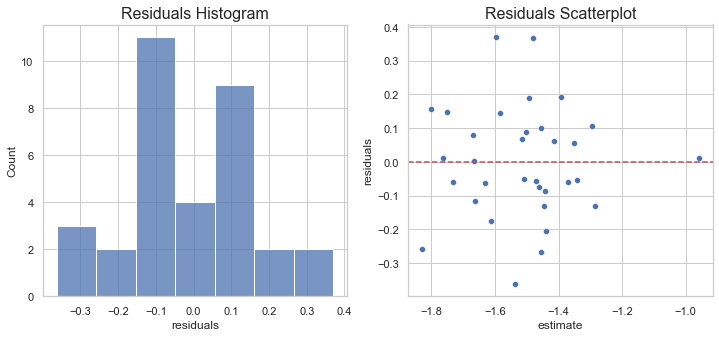

In [564]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5), sharex=False, sharey=False)

p = sns.histplot(data=rail_model_la, x='residuals', ax=ax[0])
q = sns.scatterplot(x = "estimate", y = "residuals", data = rail_model_la, ax=ax[1])
q.axhline(y=0, color='r', ls='--')
p.set_title("Residuals Histogram", fontsize = 16)
q.set_title("Residuals Scatterplot", fontsize = 16)

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\geopandas\plotting.py:568: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  FutureWarning,


Text(0.5, 0.98, 'Model Residuals')

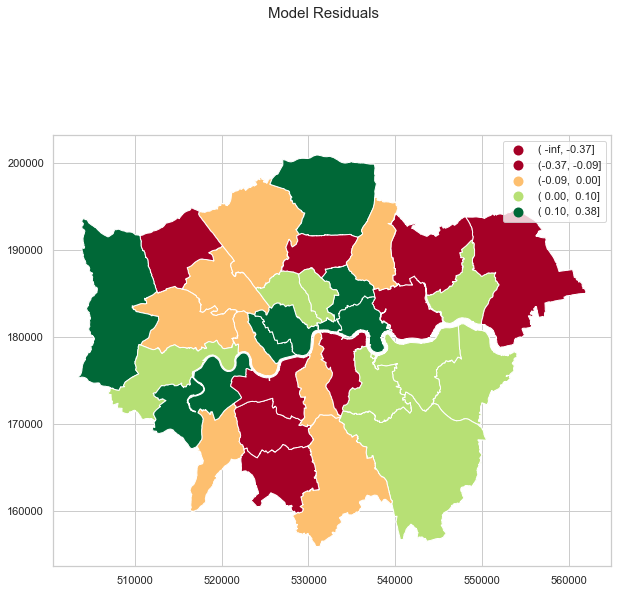

In [565]:
# Plot differences, should we normalise it?

f,ax = plt.subplots(1, 1, figsize = (10,10))

df = rail_model_la

plotmsoa = msoas.plot(axes=ax,alpha=0.8,color='gainsboro')
plotdiff = df.plot(column='residuals', ax=ax, cmap = 'RdYlGn',legend = True, scheme = 'box_plot')
                                                                        

f.suptitle('Model Residuals', fontsize=15)

In [ ]:
# Add in new attributes: IMD, Covid Deaths, Restrictions, Population, other POIs
# First, we'll do this at a time series level, then after an OLS, determine the right aggregate level to check it out.
# Add dummy variables for month
# Need to decide if we add days since restrictions 

# IMD (technically, IMD is at an LSOA level), so first we'll aggregate IMD to LA

imd_la2 = imd.groupby(['LADcd', 'LADnm']).agg({'IMD_Rank':'mean',
                                             'IMD_Decile':'mean',
                                             'IMDScore':'mean',
                                             'IMDRank0':'mean',
                                             'IMDDec0':'mean',
                                             'TotPop':'sum',
                                             'Pop16_59':'sum',
                                             'Pop60_':'sum',
                                             'WorkPop':'sum'}).reset_index()

df = rail_modelts_la 
df = df.merge(imd_la2, left_on = 'la_code', right_on = 'LADcd')

# Covid Deaths
coviddeaths['date'] = pd.to_datetime(coviddeaths['date'])
df = df.merge(coviddeaths, how = 'left', left_on = ['la_code', 'travel_date'], right_on = ['areaCode', 'date'])

# Covid Restrictions
covidrestrictions['date'] = pd.to_datetime(covidrestrictions['date'])
covidrestrictions['number_restrictions'] = covidrestrictions['schools_closed'] + covidrestrictions['pubs_closed'] + covidrestrictions['shops_closed'] + covidrestrictions['eating_places_closed'] + covidrestrictions['stay_at_home'] + covidrestrictions['wfh'] + covidrestrictions['rule_of_6_indoors'] + covidrestrictions['curfew']
df = df.merge(covidrestrictions, how='left', left_on = 'travel_date', right_on = 'date')

# Rename columns

df.rename(columns = {'IMD_Rank':"imd_rank",
                          "IMD_Decile":"imd_decile",
                          'IMDScore':'imd_score',
                          'IMDRank0':'imd_rank0',
                          'IMDDec0':'imd_dec0',
                          'TotPop':'tot_pop',
                          'Pop16_59':'pop16_59',
                          'Pop60_':'pop60',
                          'WorkPop':'workpop',
                          'newDeaths28DaysByDeathDateRate':'covid_deathrate'}, inplace = True)

# Population Percentage
df['pop16_59_pct'] = df['pop16_59']/df['tot_pop']
df['pop60_pct'] = df['pop60']/df['tot_pop']
df['workpop_pct'] = df['workpop']/df['tot_pop']

# Dummy for Month
dummies = pd.get_dummies(df['month'], prefix = 'month_', drop_first=True) #dropping a column because 'dummy trap'
df = pd.concat([df, dummies], axis = 1)

rail_modelts_la = df

In [418]:
# Time Series Model
df = rail_modelts_la[['pct_diff',
                      'weekend',
                      'la_name',
                      'number_tubestations',
                      'lag_logorigin',
                      'imd_rank',
                      'imd_score',
                      'covid_deathrate',
                      'schools_closed',
                      'pubs_closed',
                      'shops_closed',
                      'eating_places_closed',
                      'stay_at_home', 
                      'household_mixing_indoors_banned',
                      'wfh',
                      'rule_of_6_indoors',
                      'curfew',
                      'eat_out_to_help_out', 
                      'number_restrictions', 
                      'pop16_59_pct',
                      'pop60_pct',
                      'workpop_pct',
                      'month__4',
                      'month__5', 
                      'month__6',
                      'month__7', 
                      'month__8',
                      'month__9',
                      'month__10',
                      'month__11']]

columns = df.iloc[:, 1:df.shape[1]]
columns

,weekend,la_name,number_tubestations,lag_logorigin,imd_rank,imd_score,covid_deathrate,schools_closed,pubs_closed,shops_closed,...,pop60_pct,workpop_pct,month__4,month__5,month__6,month__7,month__8,month__9,month__10,month__11
0,0,Barnet,18,8.90,19287.45,15.95,0.30,1,1,0,...,0.18,0.61,0,0,0,0,0,0,0,0
1,0,Barnet,18,9.84,19287.45,15.95,1.00,1,1,1,...,0.18,0.61,0,0,0,0,0,0,0,0
2,0,Barnet,18,9.44,19287.45,15.95,2.50,1,1,1,...,0.18,0.61,0,0,0,0,0,0,0,0
3,0,Barnet,18,9.20,19287.45,15.95,1.50,1,1,1,...,0.18,0.61,0,0,0,0,0,0,0,0
4,0,Barnet,18,9.11,19287.45,15.95,1.50,1,1,1,...,0.18,0.61,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8344,0,Sutton,9,8.72,21630.72,13.82,1.00,0,1,1,...,0.20,0.60,0,0,0,0,0,0,0,1
8345,1,Sutton,9,8.72,21630.72,13.82,1.50,0,1,1,...,0.20,0.60,0,0,0,0,0,0,0,1
8346,0,Sutton,9,8.71,21630.72,13.82,1.00,0,1,1,...,0.20,0.60,0,0,0,0,0,0,0,1
8347,0,Sutton,7,7.99,21630.72,13.82,1.00,0,1,1,...,0.20,0.60,0,0,0,0,0,0,0,1


In [448]:
# Create OLS Model
#model_la_20 = sm.formula.ols('pct_diff ~ columns', data=df).fit()
#model_la_20.summary()

In [449]:
df = rail_modelts_la[rail_modelts_la['travel_date']<='09/14/2020']
df = df.groupby(['la_name', 'la_code', ])

,travel_date,year,month,weekday,weekend,la_name,la_code,geometry,origin_trips,destination_trips,...,pop60_pct,workpop_pct,month__4,month__5,month__6,month__7,month__8,month__9,month__10,month__11
0,2020-03-23,2020,3,Monday,0,Barnet,E09000003,"POLYGON ((524579.900 198355.200, 524594.300 19...",18798,18302,...,0.18,0.61,0,0,0,0,0,0,0,0
1,2020-03-24,2020,3,Tuesday,0,Barnet,E09000003,"POLYGON ((524579.900 198355.200, 524594.300 19...",12614,12245,...,0.18,0.61,0,0,0,0,0,0,0,0
2,2020-03-25,2020,3,Wednesday,0,Barnet,E09000003,"POLYGON ((524579.900 198355.200, 524594.300 19...",9866,9535,...,0.18,0.61,0,0,0,0,0,0,0,0
3,2020-03-26,2020,3,Thursday,0,Barnet,E09000003,"POLYGON ((524579.900 198355.200, 524594.300 19...",9020,8804,...,0.18,0.61,0,0,0,0,0,0,0,0
4,2020-03-27,2020,3,Friday,0,Barnet,E09000003,"POLYGON ((524579.900 198355.200, 524594.300 19...",8598,8303,...,0.18,0.61,0,0,0,0,0,0,0,0


In [463]:
coviddeaths

,areaCode,areaName,areaType,date,newDeaths28DaysByDeathDateRate
0,E06000003,Redcar and Cleveland,ltla,2021-04-29,0.00
1,E07000040,East Devon,ltla,2021-04-29,0.00
2,E07000090,Havant,ltla,2021-04-29,0.00
3,E07000214,Surrey Heath,ltla,2021-04-29,0.00
4,E07000229,Worthing,ltla,2021-04-29,0.00
...,...,...,...,...,...
144824,E07000084,Basingstoke and Deane,ltla,2020-03-15,1.10
144825,E07000176,Rushcliffe,ltla,2020-03-15,0.00
144826,E07000218,North Warwickshire,ltla,2020-03-15,1.50
144827,E07000176,Rushcliffe,ltla,2020-03-14,0.00


In [1551]:
## Covid Data_v2

# Covid: convert date to date time
covidrestrictions['date'] = pd.to_datetime(covidrestrictions['date'])


# Covid Restrictions: Loop to calculate the number of days since previous restriction
# Right now this has a problem as daysend counts even if it never started. 

# For Loop to count the number of days since the restrictions started
for i in range(1, len(covidrestrictions.columns)):
    covidrestrictions[str(f"daysstrt_{covidrestrictions.columns[i]}")] = 2
    k = len(covidrestrictions.columns)
    #print(k)
    #covidrestrictions.columns[k-1]
    #covidrestrictions.iloc[j,k]
    #print(covidrestrictions.columns[i])
    #print(str(f"daysstrt_{covidrestrictions.columns[i]}"))
    #print(covidrestrictions.iloc[i,1])
    for j in range(0, len(covidrestrictions.index)):
        #print(j)
        #print(covidrestrictions.iloc[j,i])
        if (j == 0) & (covidrestrictions.iloc[j, i] == 1):
            #covidrestrictions[str(f"daysstrt_{covidrestrictions.columns[i]}")] = 0
            covidrestrictions.iloc[j,k-1] = 1
        elif (j == 0) & (covidrestrictions.iloc[j, i] == 0):
            #covidrestrictions[str(f"daysstrt_{covidrestrictions.columns[i]}")] = 0
            covidrestrictions.iloc[j,k-1] = 0
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 1) & (covidrestrictions.iloc[j-1, i] == 0):
            covidrestrictions.iloc[j,k-1] = 1
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 1) & (covidrestrictions.iloc[j-1, i] == 1):
            covidrestrictions.iloc[j,k-1] = covidrestrictions.iloc[j-1,k-1] + 1
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 0) & (covidrestrictions.iloc[j-1, i] == 1) & (covidrestrictions.iloc[j-1, k-1] > 0):
            covidrestrictions.iloc[j,k-1] = -1
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 0) & (covidrestrictions.iloc[j-1, i] == 0) & (covidrestrictions.iloc[j-1, k-1] < 0):
            covidrestrictions.iloc[j,k-1] = covidrestrictions.iloc[j-1,k-1] -1
        else:
            covidrestrictions.iloc[j,k-1] = 0
            
            
            
# For Loop to count the number of days since the restrictions ended



for i in range(1, len(covidrestrictions.columns)):
    covidrestrictions[str(f"daysend_{covidrestrictions.columns[i]}")] = 2
    k = len(covidrestrictions.columns)
    for j in range(0, len(covidrestrictions.index)):
        #print(j)
        #print(covidrestrictions.iloc[j,i])
        if (j == 0) & (covidrestrictions.iloc[j, i] == 0):
            covidrestrictions.iloc[j,k-1] = 1 # if first row of schools_closed is zero, then daysend = 1 (could be 0, doesn't matter)
        elif (j == 0) & (covidrestrictions.iloc[j, i] == 1):
            covidrestrictions.iloc[j,k-1] = 0 # if first row of schools_closed is one, then daysend = 0
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 1) & (covidrestrictions.iloc[j-1, i] == 0):# & (covidrestrictions.iloc[j-1, i] == 0):
            covidrestrictions.iloc[j,k-1] = -1 # if second row of schools_closed is one, then daysend = 0
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 0) & (covidrestrictions.iloc[j-1, i] == 0):
            covidrestrictions.iloc[j,k-1] = covidrestrictions.iloc[j-1,k-1] + 1
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 0) & (covidrestrictions.iloc[j-1, i] == 1) & (covidrestrictions.iloc[j-1, k-1] <= 0):
            covidrestrictions.iloc[j,k-1] = 1
        elif (j > 0) & (covidrestrictions.iloc[j, i] == 1) & (covidrestrictions.iloc[j-1, i] == 1) & (covidrestrictions.iloc[j-1, k-1] <= 0):
            covidrestrictions.iloc[j,k-1] = covidrestrictions.iloc[j-1,k-1] - 1
        else:
            covidrestrictions.iloc[j,k-1] = 0
            

NameError: name 'weights' is not defined

### Plotting

#### Trendlines

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  after removing the cwd from sys.path.


<AxesSubplot:xlabel='month', ylabel='destination_trips'>

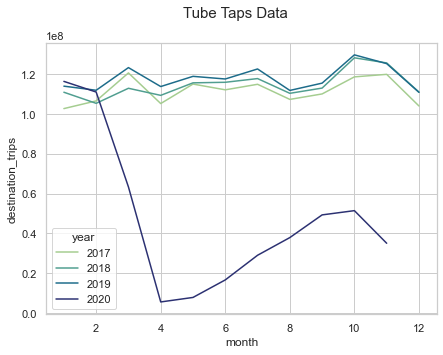

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(7, 5), sharex=False, sharey=False)
fig.suptitle('Tube Taps Data', fontsize=15)
#test = tube_covid.groupby(['year', 'month'])['origin_trips', 'destination_trips'].agg('sum').reset_index()
sns.lineplot(data = tube_covid[tube_covid['year']>=2017].groupby(['year','month'])['origin_trips','destination_trips'].agg('sum'),
             x = "month", y = "destination_trips", hue = "year", ci = None, palette = "crest")

<AxesSubplot:xlabel='travel_date', ylabel='origin_trips'>

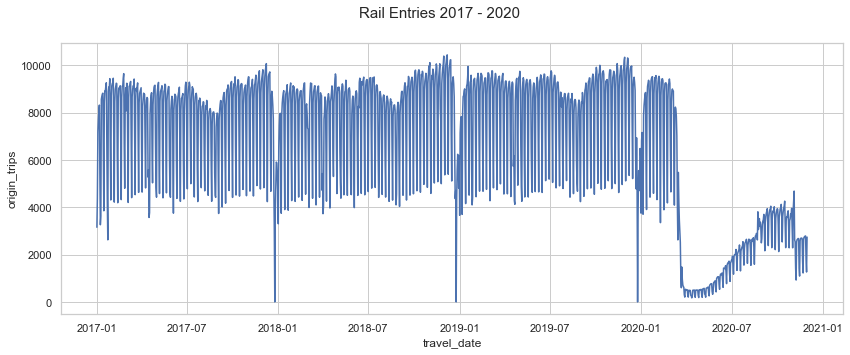

In [83]:
fig, ax = plt.subplots(1, 1, figsize=(14, 5), sharex=False, sharey=False)
fig.suptitle('Rail Entries 2017 - 2020', fontsize=15)
#test = tube_covid.groupby(['year', 'month'])['origin_trips', 'destination_trips'].agg('sum').reset_index()
sns.lineplot(data = tubecovid_pct[tubecovid_pct['year']>=2017], x = "travel_date", y = "origin_trips", ci = None)

In [117]:
sns.boxplot(x='year', y='origin_trips', data = tubecovid_pct)

KeyboardInterrupt: 

In [ ]:
sns.boxplot(x='month', y = 'origin_trips', data = tubecovid_pct)

In [145]:
test = tubecovid_pct[tubecovid_pct['date']>='01/01/2018']
test = test.groupby('travel_date')['origin_trips'].agg('sum')
#tubecovid_pct = tubecovid_pct.set_index('travel_date')
#tubecovid_pct.index
#test.sort_index(inplace = True)
#test.index
test.head(20)

travel_date
2018-01-01    3036136.0
2018-01-02    2516013.0
2018-01-03    3338356.0
2018-01-04    3812508.0
2018-01-05    3720128.0
2018-01-06    2699022.0
2018-01-07    3148838.0
2018-01-08    3381282.0
2018-01-09    3140972.0
2018-01-10    3232970.0
2018-01-11    3214064.0
2018-01-12    3292063.0
2018-01-13    3533498.0
2018-01-14    3168818.0
2018-01-15    3514481.0
2018-01-16    2835398.0
2018-01-17    3186699.0
2018-01-18    3275583.0
2018-01-19    3757991.0
2018-01-20    3494142.0
Name: origin_trips, dtype: float64

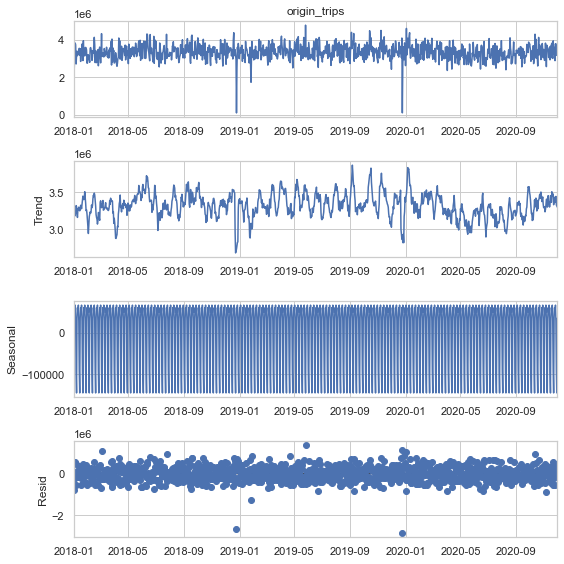

In [148]:
rcParams['figure.figsize'] = 8, 8

decomposition = sm.tsa.seasonal_decompose(test, model = 'additive', extrapolate_trend = 'freq')
fig = decomposition.plot()
plt.show()

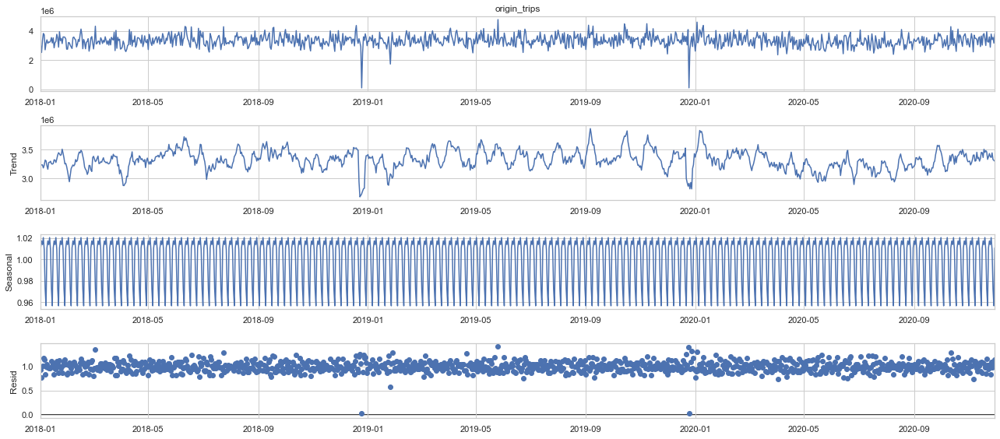

In [147]:
rcParams['figure.figsize'] = 8, 8

decomposition = sm.tsa.seasonal_decompose(test, model = 'multiplicative', extrapolate_trend = 'freq')
fig = decomposition.plot()
plt.show()

In [116]:
df = tubecovid_pct.groupby(['travel_date', 'msoa_name'])['origin_trips']
df

In [114]:
df

In [108]:
df_2 = calendar.merge(test, left_on = 'date', right_on = 'travel_date')

In [110]:
df = df_2.isnull()
df_has_nan = df.any(axis=1)
rows_with_NaN = df_2[df_has_nan]
rows_with_NaN

,date,day,weekday,month,week,year,msoa_name,origin_trips


ValueError: You must specify a period or x must be a pandas object with a DatetimeIndex with a freq not set to None

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


Text(0.5, 1.0, 'Destination Trips starting at first Lockdown')

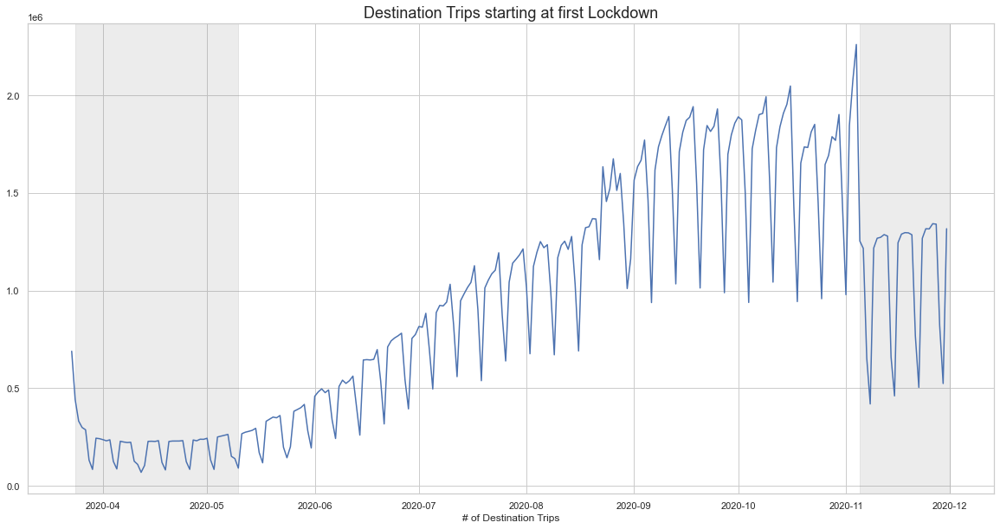

In [53]:
# This chart indicates that we have more data on travel from lockdown restrictions in wave 1, but will not be able to consider how wave 2 may either
# increase dread or numb the population from risk. 

f,ax = plt.subplots(1, 1, figsize = (20,10))

df = tubecovid_pct[tubecovid_pct['travel_date']>='03/23/2020'].groupby('travel_date')['origin_trips', 'destination_trips'].agg('sum').reset_index()

ax.axvspan(date2num(datetime(2020,3,24)), date2num(datetime(2020,5,10)), color="grey", alpha=0.15)
ax.axvspan(date2num(datetime(2020,11,5)), date2num(datetime(2020,12,1)), color="grey", alpha=0.15)
#ax.axvspan(date2num(datetime(2020,12,20)), date2num(datetime(2021,3,14)), color="grey", alpha=0.15)
#ax.axvspan(date2num('05/11/2020'), '12/01/2020', color="grey", alpha=0.15)
#ax.axvspan('12/20/2020', '03/14/2021', color="grey", alpha=0.15)
ax.plot(df['travel_date'], df['destination_trips'], label='trips')
ax.set_xlabel('Travel Date')
ax.set_xlabel('# of Destination Trips')
ax.set_title('Destination Trips starting at first Lockdown', size=18)

<AxesSubplot:xlabel='date', ylabel='destination_trips'>

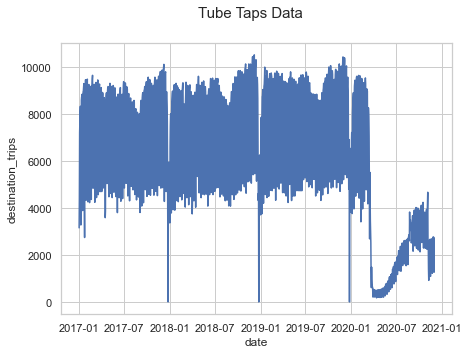

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(7, 5), sharex=False, sharey=False)
fig.suptitle('Tube Taps Data', fontsize=15)
#test = tube_covid.groupby(['year', 'month'])['origin_trips', 'destination_trips'].agg('sum').reset_index()
sns.lineplot(data = tube_covid[tube_covid['year']>=2017]
                               , x = "date", y = "destination_trips",  ci = None, palette = "Set2")

#### Spatial Plots

Text(0.5, 0.98, 'Tube Taps Data')

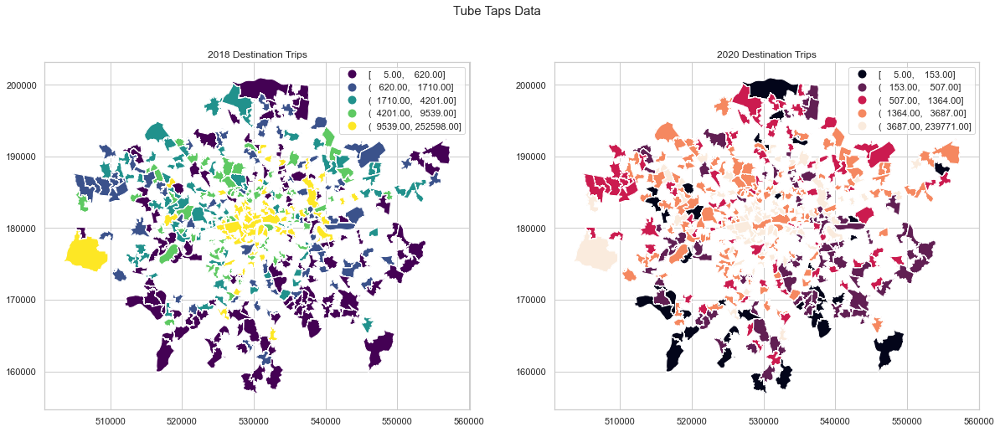

In [55]:
#df_tube.plot(column='destination_trips',legend=True, cmap="vlag",label="Number of Trips to Destination")

f,ax = plt.subplots(1, 2, figsize = (20,8))

#tubemin = min(tube_covid.groupby(['GSS_CODE','year'])['destination_trips'].agg('sum'))
#tubemax = min(tube_covid.groupby(['GSS_CODE','year'])['destination_trips'].agg('sum'))


tube_covid[tube_covid['year']==2018].plot(column='destination_trips',ax=ax[0], cmap = 'viridis', scheme = 'quantiles', legend = True)
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=tubemin, vmax = tubemax))
ax[0].set_title('2018 Destination Trips')
#cbar = fig.colorbar(extend='both')
#plt.imshow()
#plt.colorbar(extend = 'both')
#plt.clim(-1,1)

tube_covid[tube_covid['year']==2020].plot(column='destination_trips',ax=ax[1], scheme = 'quantiles', legend = True)
ax[1].set_title('2020 Destination Trips')

f.suptitle('Tube Taps Data', fontsize=15)

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\geopandas\plotting.py:568: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  FutureWarning,


Text(0.5, 0.98, 'Tube Taps Data')

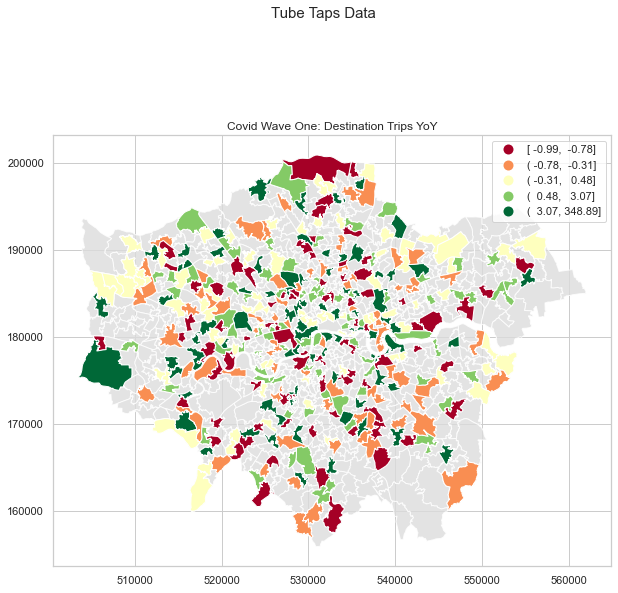

In [56]:
f,ax = plt.subplots(1, 1, figsize = (10,10))

df = tube_waveone#[tube_waveone['dest_pctyoy']<=10]

#tubemin = min(tube_covid.groupby(['GSS_CODE','year'])['destination_trips'].agg('sum'))
#tubemax = min(tube_covid.groupby(['GSS_CODE','year'])['destination_trips'].agg('sum'))

vmin, vmax = -5,5

plotmsoa = msoas.plot(axes=ax,alpha=0.8,color='gainsboro')
plotjun = df.plot(column='dest_pctyoy', ax=ax, cmap = 'RdYlGn',legend = True, scheme = 'quantiles')
                                                                         
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=tubemin, vmax = tubemax))
ax.set_title('Covid Wave One: Destination Trips YoY')
#cbar = fig.colorbar(ax.imshow([np.array([-1,1])], plt.cm.RdYlGn))
#plt.imshow(tube_pct[(tube_pct['year']==2020)&(tube_pct['month']==9)]['dest_pctyoy'], vmin = -1, vmax = 1, cmap = plt.cm.RdYlGn)

#plt.colorbar(plotjun, vmin = -1, vmax = 1, ax = ax[0])
#plt.im.set_clim(-1,1)
#plt.clim(-1,1)
#plt.pcolor(vmin=-1, vmax = 1)
#ax.axis('off')
#sm = plt.cm.ScalarMappable(cmap = "RdYlGn", norm = plt.Normalize(vmin=vmin, vmax=vmax))
#sm.set_array([])
#cbar = fig.colorbar(sm)

#tube_pct[(tube_pct['year']==2020)&(tube_pct['month']==9)].plot(column='dest_pctyoy',ax=ax[1], cmap = 'RdYlGn', legend = True)
#ax[1].set_title('2020 Destination YoY Sep')

f.suptitle('Tube Taps Data', fontsize=15)

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\geopandas\plotting.py:568: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  FutureWarning,


Text(0.5, 0.98, 'Tube Taps Data')

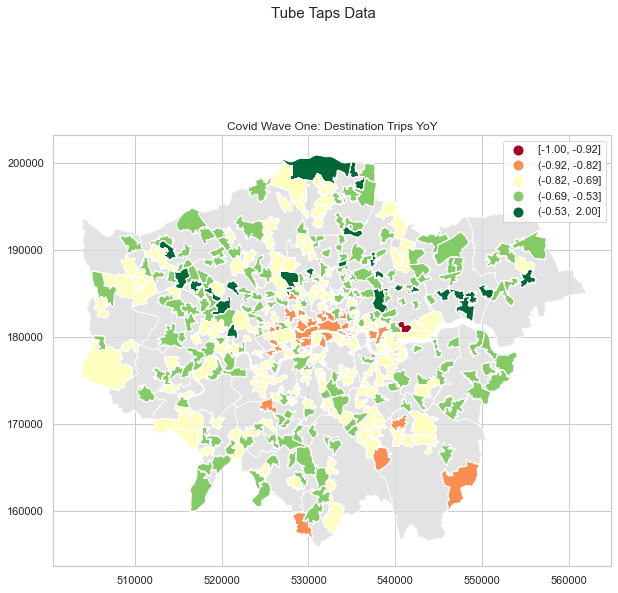

In [57]:
f,ax = plt.subplots(1, 1, figsize = (10,10))

df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['travel_date']<='11/05/2020')&(tubecovid_pct['dest_pctyoy']<=2)]


plotboroughs = boroughs.plot(axes=ax,alpha=0.8,color='gainsboro')
plot = df.plot(column='dest_pctyoy', ax=ax, cmap = 'RdYlGn',legend = True, scheme = 'quantiles')
                                                                         
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=tubemin, vmax = tubemax))
ax.set_title('Covid Wave One: Destination Trips YoY')


f.suptitle('Tube Taps Data', fontsize=15)

#### Histograms

<AxesSubplot:xlabel='dest_pctyoy', ylabel='Count'>

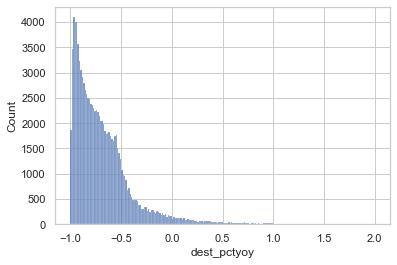

In [58]:
# The below histogram tells us that we should look at trips below 200% change over 2019, and consider anything above this as an outlier
# Helpful to conduct a Tukey test to statistically determine outliers
# May also need to do a log transformation

#df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['msoa_name']>='Richmond upon Thames 014')&(tubecovid_pct['dest_pctyoy']<=2)]
df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['travel_date']<='11/05/2020')&(tubecovid_pct['dest_pctyoy']<=2)]

sns.histplot(data=df, x='dest_pctyoy')#, bins = 25)

#ax.set(ylim=(0, 400))

<AxesSubplot:xlabel='dest_pctyoy', ylabel='Count'>

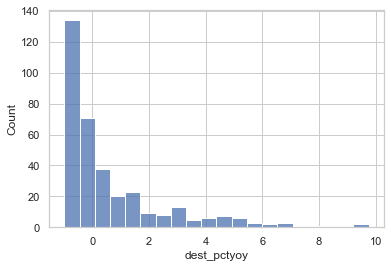

In [59]:
df = tube_waveone[tube_waveone['dest_pctyoy']<=10]

sns.histplot(data = df, x='dest_pctyoy')

<AxesSubplot:xlabel='workpop_pct', ylabel='Count'>

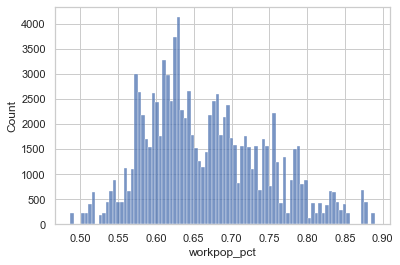

In [60]:
df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['travel_date']<='11/05/2020')&(tubecovid_pct['dest_pctyoy']<=2)]

sns.histplot(data = df, x='workpop_pct')

<AxesSubplot:xlabel='dest_pctyoy', ylabel='Count'>

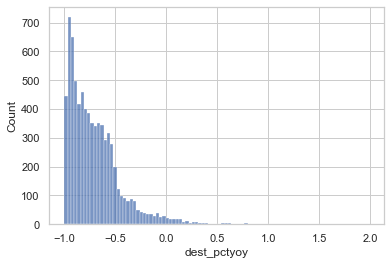

In [61]:
df = tubecovid_la[(tubecovid_la['travel_date']>='03/23/2020')&(tubecovid_la['travel_date']<='11/05/2020')&(tubecovid_la['dest_pctyoy']<=2)]

sns.histplot(data = df, x='dest_pctyoy')

<AxesSubplot:xlabel='log_dest', ylabel='Count'>

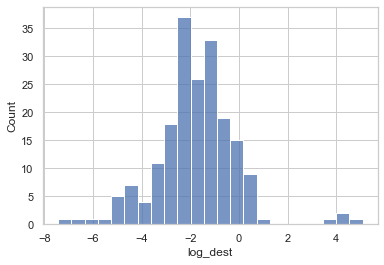

In [62]:
df = tubecovid_la[(tubecovid_la['travel_date']>='03/23/2020')&(tubecovid_la['travel_date']<='11/05/2020')]

sns.histplot(data = df, x='log_dest')

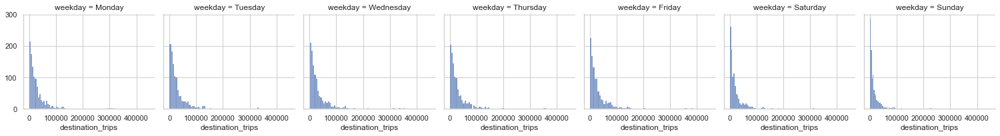

In [63]:
df = tubecovid_la[(tubecovid_la['travel_date']>='03/23/2020')&(tubecovid_la['travel_date']<='11/05/2020')]

#sns.histplot(data = df, x='destination_trips', col="weekday")

g = sns.FacetGrid(df, col="weekday")
g.map(sns.histplot, "destination_trips")

#### Scatter Plots

Text(0.5, 1.0, 'Destination Trips vs. Covid Restrictions: School')

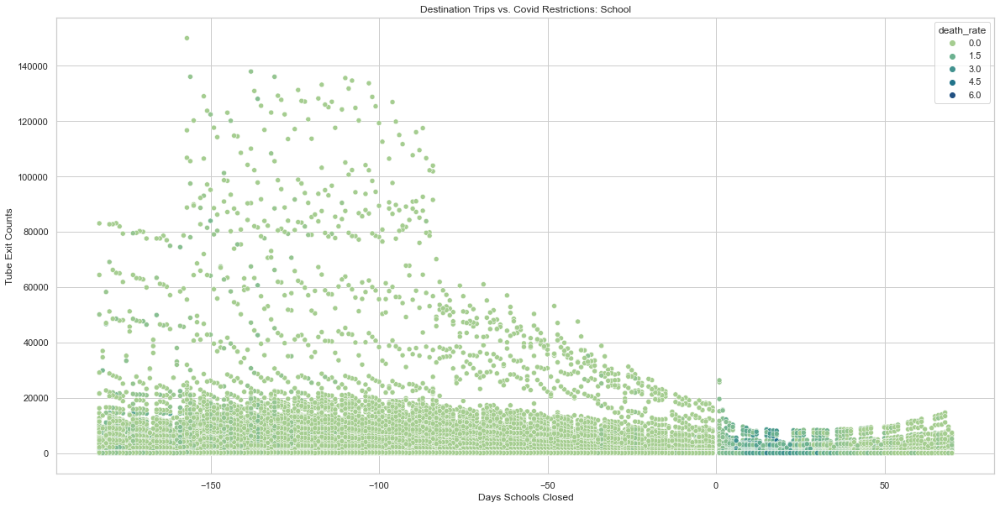

In [64]:
f,ax = plt.subplots(1, 1, figsize = (20,10))



p = sns.scatterplot(data = tube_covid[tube_covid['travel_date']>='03/23/2020'], x = "daysstrt_schools_closed", y = "destination_trips", hue='death_rate', palette = 'crest')
#ax.set_title('Days Since Schools Closed vs. Destination Trips')
#dest_mean_line = plt.plot(tube_covid['daysstrt_schools_closed'],tube_covid['destination_trips'].rolling(window = 30).mean(),linestyle='--',color='red')
#sns.set(font_scale=5)
p.set_xlabel("Days Schools Closed")#, fontsize = 20)
p.set_ylabel("Tube Exit Counts")#, fontsize = 20)
p.set_title("Destination Trips vs. Covid Restrictions: School")#, fontsize = 25)
#plt.legend(labels = "Covid Death Rate", fontsize = 20)
#f.suptitle('Destination Trips vs. Covid Restrictions: School', fontsize=15)

Text(0.5, 1.0, 'Destination Trips vs. Covid Restrictions: Pub')

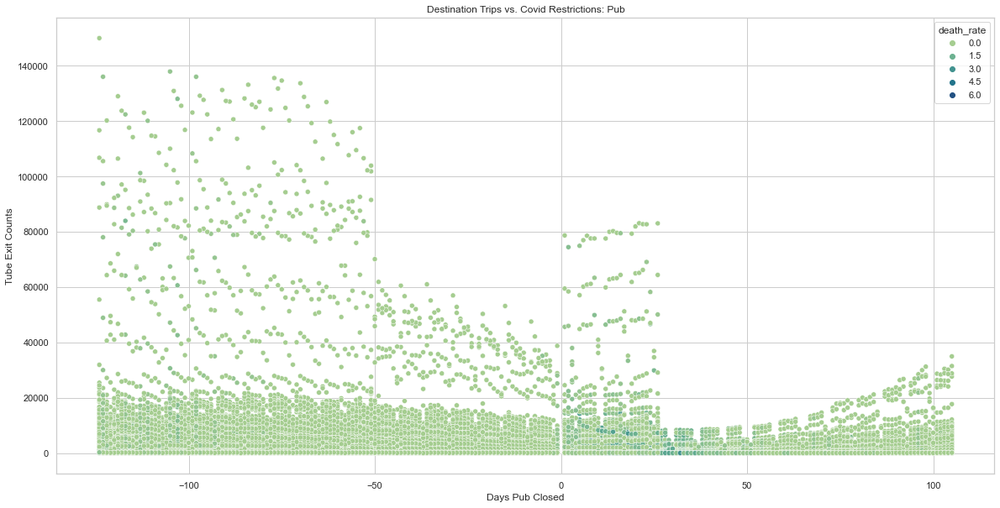

In [65]:
f,ax = plt.subplots(1, 1, figsize = (20,10))

p = sns.scatterplot(data = tube_covid[tube_covid['travel_date']>='03/23/2020'], x = "daysstrt_pubs_closed", y = "destination_trips", hue='death_rate', palette = 'crest')
#ax.set_title('Days Since Schools Closed vs. Destination Trips')
#dest_mean_line = plt.plot(tube_covid['daysstrt_schools_closed'],tube_covid['destination_trips'].rolling(window = 30).mean(),linestyle='--',color='red')
#sns.set(font_scale=5)
p.set_xlabel("Days Pub Closed")#, fontsize = 20)
p.set_ylabel("Tube Exit Counts")#, fontsize = 20)
p.set_title("Destination Trips vs. Covid Restrictions: Pub")#, fontsize = 25)
#plt.legend(labels = "Covid Death Rate", fontsize = 20)
#f.suptitle('Destination Trips vs. Covid Restrictions: School', fontsize=15)

Text(0.5, 1.0, 'Destination Pct YoY vs. Covid Restrictions: Pub')

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


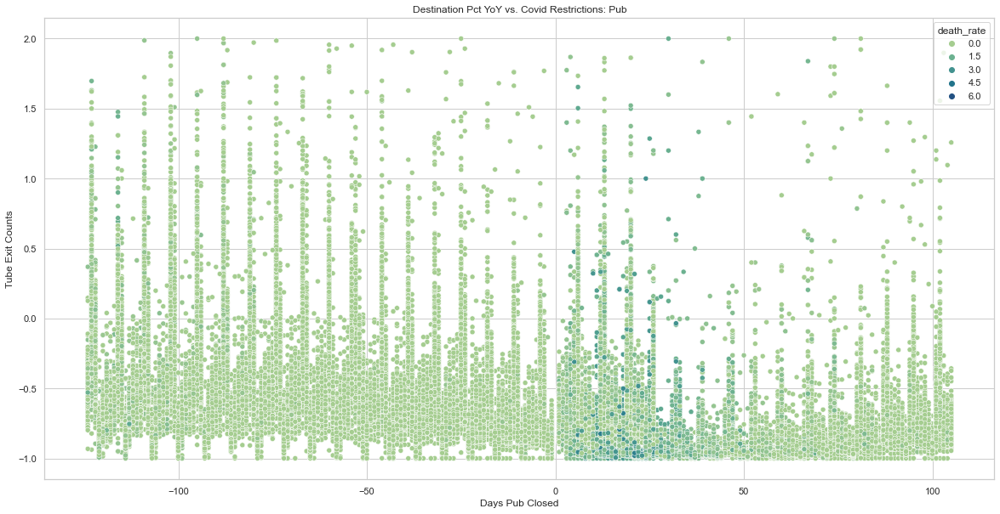

In [66]:
f,ax = plt.subplots(1, 1, figsize = (20,10))

df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['dest_pctyoy']<=2)]

#p = sns.scatterplot(data = tubecovid_pct[tubecovid_pct['travel_date']>='03/23/2020'], x = "daysstrt_pubs_closed", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
p = sns.scatterplot(data = df, x = "daysstrt_pubs_closed", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
#ax.set_title('Days Since Schools Closed vs. Destination Trips')
#dest_mean_line = plt.plot(tube_covid['daysstrt_schools_closed'],tube_covid['destination_trips'].rolling(window = 30).mean(),linestyle='--',color='red')
#sns.set(font_scale=5)
p.set_xlabel("Days Pub Closed")#, fontsize = 20)
p.set_ylabel("Tube Exit Counts")#, fontsize = 20)
p.set_title("Destination Pct YoY vs. Covid Restrictions: Pub")#, fontsize = 25)
#plt.legend(labels = "Covid Death Rate", fontsize = 20)
#f.suptitle('Destination Trips vs. Covid Restrictions: School', fontsize=15)

Text(0.5, 1.0, 'Destination Pct YoY vs. Covid Restrictions: Pub')

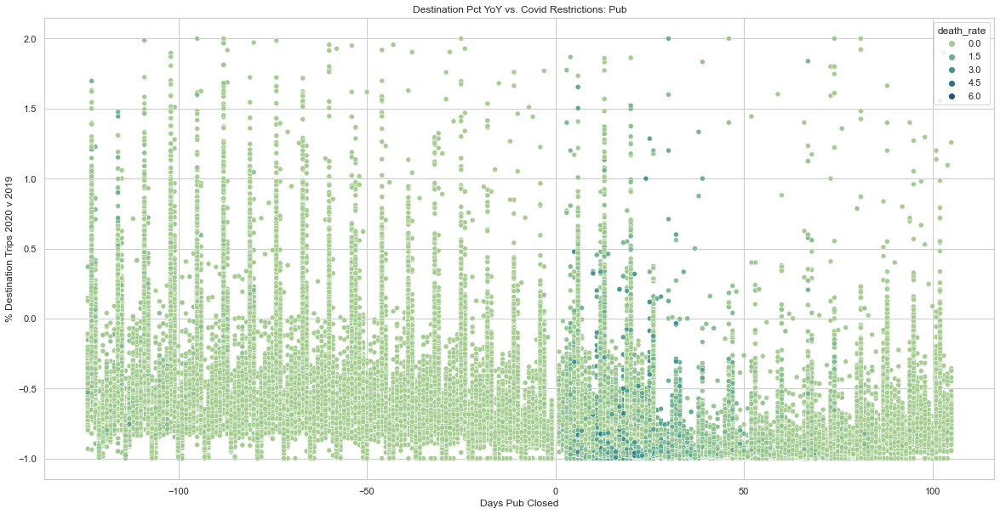

In [67]:
f,ax = plt.subplots(1, 1, figsize = (20,10))

df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['dest_pctyoy']<=2)]

#p = sns.scatterplot(data = tubecovid_pct[tubecovid_pct['travel_date']>='03/23/2020'], x = "daysstrt_pubs_closed", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
p = sns.scatterplot(data = df, x = "daysstrt_pubs_closed", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
#ax.set_title('Days Since Schools Closed vs. Destination Trips')
#dest_mean_line = plt.plot(tube_covid['daysstrt_schools_closed'],tube_covid['destination_trips'].rolling(window = 30).mean(),linestyle='--',color='red')
#sns.set(font_scale=5)
p.set_xlabel("Days Pub Closed")#, fontsize = 20)
p.set_ylabel("% Destination Trips 2020 v 2019")#, fontsize = 20)
p.set_title("Destination Pct YoY vs. Covid Restrictions: Pub")#, fontsize = 25)
#plt.legend(labels = "Covid Death Rate", fontsize = 20)
#f.suptitle('Destination Trips vs. Covid Restrictions: School', fontsize=15)

Text(0.5, 1.0, 'Destination Pct YoY vs. Covid Death Rate')

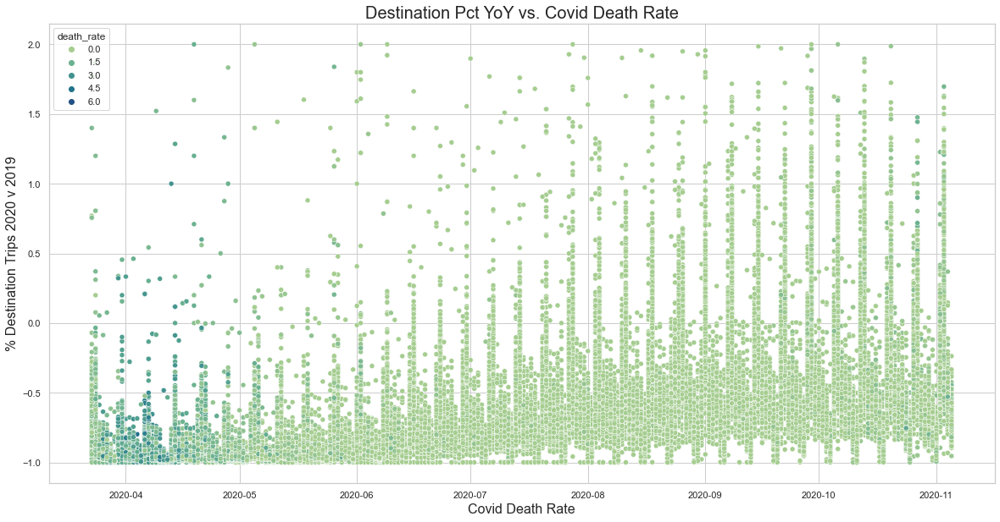

In [68]:
f,ax = plt.subplots(1, 1, figsize = (20,10))

df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')
                   &(tubecovid_pct['dest_pctyoy']<=2)]

#p = sns.scatterplot(data = tubecovid_pct[tubecovid_pct['travel_date']>='03/23/2020'], x = "daysstrt_pubs_closed", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
p = sns.scatterplot(data = df, x = "travel_date", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
#ax.set_title('Days Since Schools Closed vs. Destination Trips')
#dest_mean_line = plt.plot(tube_covid['daysstrt_schools_closed'],tube_covid['destination_trips'].rolling(window = 30).mean(),linestyle='--',color='red')
#sns.set(font_scale=5)
p.set_xlabel("Covid Death Rate", fontsize = 16)
p.set_ylabel("% Destination Trips 2020 v 2019", fontsize = 16)
p.set_title("Destination Pct YoY vs. Covid Death Rate", fontsize = 20)
#plt.legend(labels = "Covid Death Rate", fontsize = 20)
#f.suptitle('Destination Trips vs. Covid Restrictions: School', fontsize=15)

<AxesSubplot:xlabel='travel_date', ylabel='dest_pctyoy'>

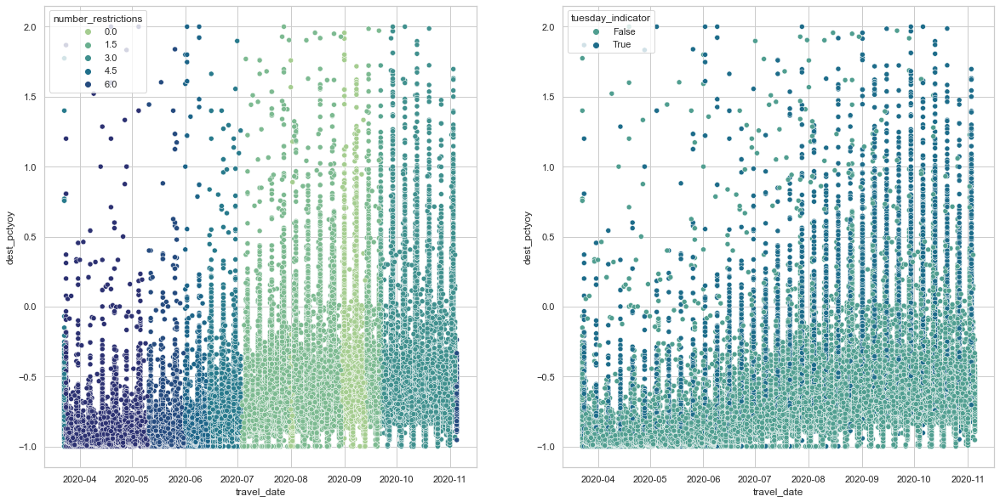

In [69]:
df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')
                   &(tubecovid_pct['dest_pctyoy']<=2)]

f,ax = plt.subplots(1, 2, figsize = (20,10))
#ax0 = ax.flatten()

sns.scatterplot(data = df, x = "travel_date", y = "dest_pctyoy", hue = 'number_restrictions', palette = 'crest', ax=ax[0])
sns.scatterplot(data = df, x = "travel_date", y = "dest_pctyoy", hue = 'tuesday_indicator', palette = 'crest', ax=ax[1])

#p.set_xlabel("Days Pub Closed", fontsize = 16)
#p.set_ylabel("% Destination Trips 2020 v 2019", fontsize = 16)
#p.set_title("Destination Pct YoY vs. Covid Death Rate", fontsize = 20)

Text(0.5, 1.0, '% Destination Trip Change vs. Travel Date: LA')

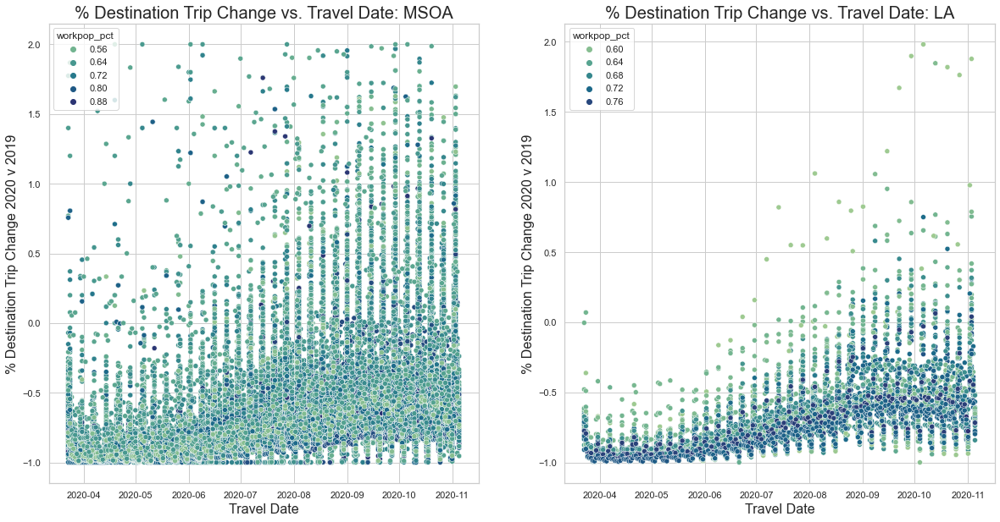

In [70]:
df_msoa = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')#]
                   &(tubecovid_pct['dest_pctyoy']<=2)]


df_la = tubecovid_la[(tubecovid_la['travel_date']>='03/23/2020')
                   &(tubecovid_la['travel_date']<='11/05/2020')#]
                   &(tubecovid_la['dest_pctyoy']<=2)]


f,ax = plt.subplots(1, 2, figsize = (20,10))
#ax0 = ax.flatten()

p = sns.scatterplot(data = df_msoa, x = "travel_date", y = "dest_pctyoy", hue = 'workpop_pct', palette = 'crest', ax=ax[0])
q = sns.scatterplot(data = df_la, x = "travel_date", y = "dest_pctyoy", hue = 'workpop_pct', palette = 'crest', ax=ax[1])
#q = sns.scatterplot(data = df, x = "workpop_pct", y = "dest_pctyoy", ax=ax[1])

p.set_xlabel("Travel Date", fontsize = 16)
p.set_ylabel("% Destination Trip Change 2020 v 2019", fontsize = 16)
p.set_title("% Destination Trip Change vs. Travel Date: MSOA", fontsize = 20)

q.set_xlabel("Travel Date", fontsize = 16)
q.set_ylabel("% Destination Trip Change 2020 v 2019", fontsize = 16)
q.set_title("% Destination Trip Change vs. Travel Date: LA", fontsize = 20)

Text(0.5, 1.0, '% Destination Trip Change vs. Work Pop%: LA')

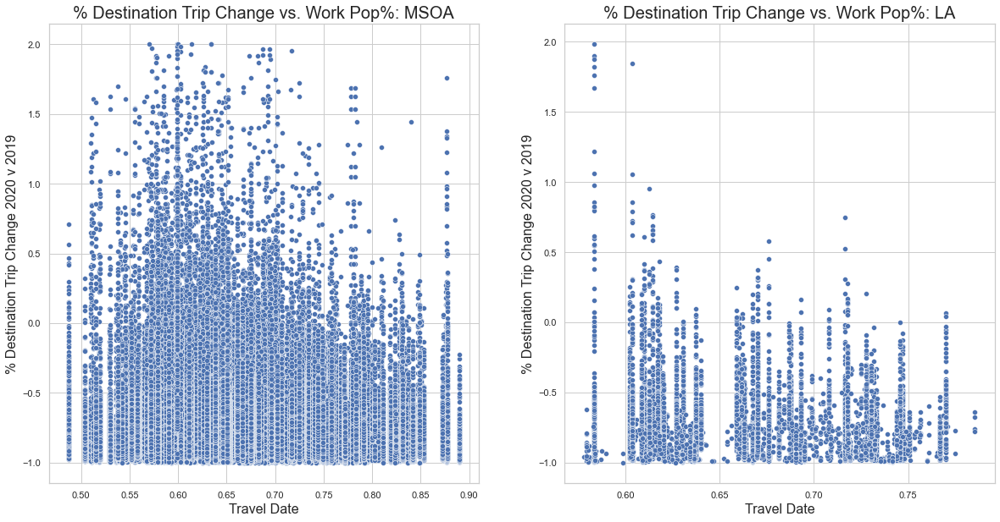

In [71]:
df_msoa = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')#]
                   &(tubecovid_pct['dest_pctyoy']<=2)]


df_la = tubecovid_la[(tubecovid_la['travel_date']>='03/23/2020')
                   &(tubecovid_la['travel_date']<='11/05/2020')#]
                   &(tubecovid_la['dest_pctyoy']<=2)]


f,ax = plt.subplots(1, 2, figsize = (20,10))
#ax0 = ax.flatten()

#p = sns.scatterplot(data = df_msoa, x = "travel_date", y = "dest_pctyoy", hue = 'workpop_pct', palette = 'crest', ax=ax[0])
p = sns.scatterplot(data = df_msoa, x = "workpop_pct", y = "dest_pctyoy", ax=ax[0])
q = sns.scatterplot(data = df_la, x = "workpop_pct", y = "dest_pctyoy", ax=ax[1])

p.set_xlabel("Travel Date", fontsize = 16)
p.set_ylabel("% Destination Trip Change 2020 v 2019", fontsize = 16)
p.set_title("% Destination Trip Change vs. Work Pop%: MSOA", fontsize = 20)

q.set_xlabel("Travel Date", fontsize = 16)
q.set_ylabel("% Destination Trip Change 2020 v 2019", fontsize = 16)
q.set_title("% Destination Trip Change vs. Work Pop%: LA", fontsize = 20)

C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\numpy\lib\nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
C:\Users\TBD\.conda\envs\urbsim\lib\site-packages\numpy\lib\nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


<AxesSubplot:xlabel='workpop_pct', ylabel='log_dest'>

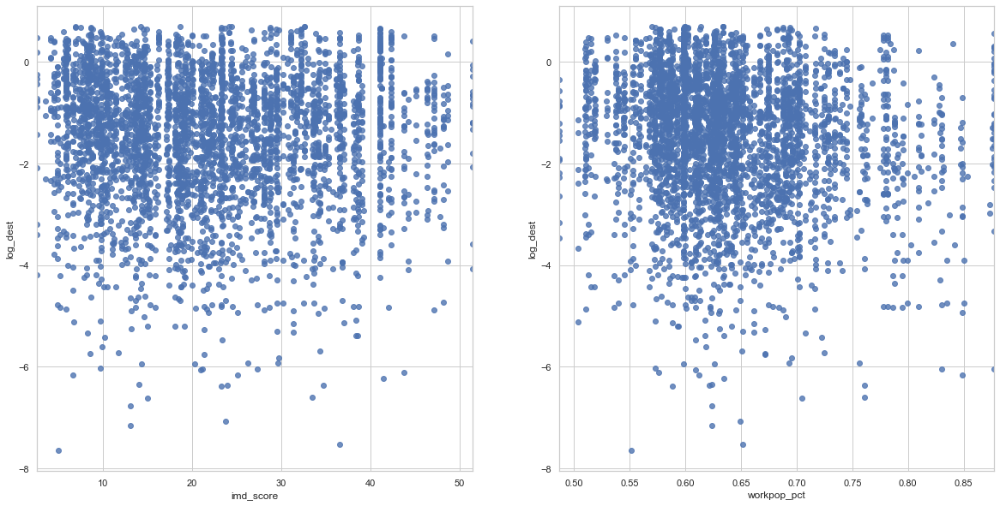

In [72]:
df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')
                   &(tubecovid_pct['dest_pctyoy']<=2)]

f,ax = plt.subplots(1, 2, figsize = (20,10))
#ax0 = ax.flatten()

sns.regplot(data = df, x = "imd_score", y = "log_dest", line_kws={"color": "red"}, ax=ax[0])
sns.regplot(data = df, x = "workpop_pct", y = "log_dest", line_kws={"color": "red"}, ax=ax[1])


Text(0.5, 1.0, 'Destination Pct YoY vs. # Tube Stations')

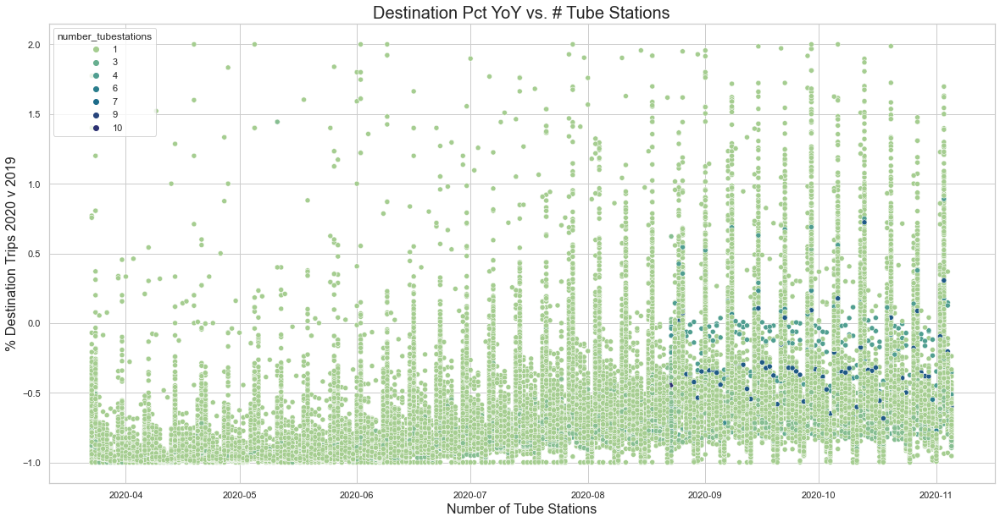

In [73]:
f,ax = plt.subplots(1, 1, figsize = (20,10))

df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')
                   &(tubecovid_pct['dest_pctyoy']<=2)]

#p = sns.scatterplot(data = tubecovid_pct[tubecovid_pct['travel_date']>='03/23/2020'], x = "daysstrt_pubs_closed", y = "dest_pctyoy", hue='death_rate', palette = 'crest')
p = sns.scatterplot(data = df, x = "travel_date", y = "dest_pctyoy", hue='number_tubestations', palette = 'crest')
#ax.set_title('Days Since Schools Closed vs. Destination Trips')
#dest_mean_line = plt.plot(tube_covid['daysstrt_schools_closed'],tube_covid['destination_trips'].rolling(window = 30).mean(),linestyle='--',color='red')
#sns.set(font_scale=5)
p.set_xlabel("Number of Tube Stations", fontsize = 16)
p.set_ylabel("% Destination Trips 2020 v 2019", fontsize = 16)
p.set_title("Destination Pct YoY vs. # Tube Stations", fontsize = 20)
#plt.legend(labels = "Covid Death Rate", fontsize = 20)
#f.suptitle('Destination Trips vs. Covid Restrictions: School', fontsize=15)

Text(0.5, 1.0, '% Change Destination Trips vs Travel Date - LA')

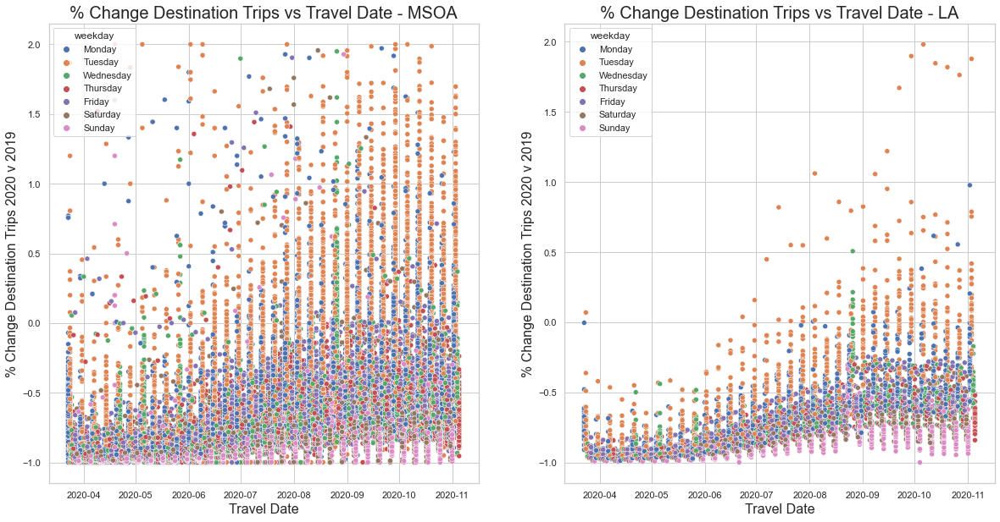

In [74]:
df_msoa = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')
                   &(tubecovid_pct['travel_date']<='11/05/2020')#]
                   &(tubecovid_pct['dest_pctyoy']<=2)]


df_la = tubecovid_la[(tubecovid_la['travel_date']>='03/23/2020')
                   &(tubecovid_la['travel_date']<='11/05/2020')#]
                   &(tubecovid_la['dest_pctyoy']<=2)]

f,ax = plt.subplots(1, 2, figsize = (20,10))
#ax0 = ax.flatten()

p = sns.scatterplot(data = df_msoa, x = "travel_date", y = "dest_pctyoy", hue = 'weekday', ax=ax[0])
q = sns.scatterplot(data = df_la, x = "travel_date", y = "dest_pctyoy", hue = 'weekday', ax=ax[1])

p.set_xlabel("Travel Date", fontsize = 16)
p.set_ylabel("% Change Destination Trips 2020 v 2019", fontsize = 16)
p.set_title("% Change Destination Trips vs Travel Date - MSOA", fontsize = 20)

q.set_xlabel("Travel Date", fontsize = 16)
q.set_ylabel("% Change Destination Trips 2020 v 2019", fontsize = 16)
q.set_title("% Change Destination Trips vs Travel Date - LA", fontsize = 20)

In [75]:
tubecovid_la.head()

,year,month,day,weekday,travel_date,la_name,la_code,tuesday_indicator,mwthf_indicator,weekend_indicator,...,workpop_pct,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,log_dest
0,2016,1,1,Friday,2016-01-01,City of London,E09000001,False,True,False,...,0.667285,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.100 180782.100, 531143.800 18...",NaN
1,2017,1,1,Sunday,2017-01-01,City of London,E09000001,False,False,True,...,0.667285,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.100 180782.100, 531143.800 18...",NaN
2,2018,1,1,Monday,2018-01-01,City of London,E09000001,False,True,False,...,0.667285,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.100 180782.100, 531143.800 18...",NaN
3,2019,1,1,Tuesday,2019-01-01,City of London,E09000001,True,False,False,...,0.667285,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.100 180782.100, 531143.800 18...",-1.169802
4,2020,1,1,Wednesday,2020-01-01,City of London,E09000001,False,True,False,...,0.667285,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.100 180782.100, 531143.800 18...",-1.604115


#### Correlation Matrix

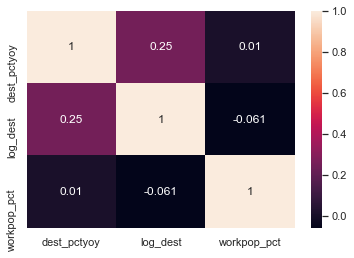

In [76]:
data = tubecovid_pct[['dest_pctyoy','log_dest','workpop_pct']]

corrMatrix = data.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

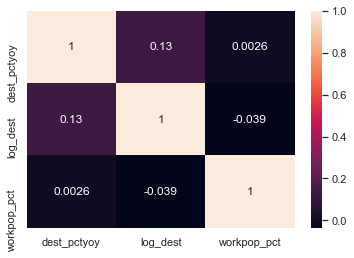

In [77]:
data = tubecovid_la[['dest_pctyoy','log_dest', 'workpop_pct']]

corrMatrix = data.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [78]:
## Creating the bus file:

# need to find geometry (easting/nothing) from the API here: https://content.tfl.gov.uk/syndication-developer-guidelines-bus-stop-locations-routes.pdf
# https://tfl.gov.uk/info-for/open-data-users/our-open-data#on-this-page-3

In [79]:
# Unused Code

# Loop testing

#covidrestrictions = pd.read_csv('restrictions_daily.csv')

# For i in the columns of covidrestrictions
# Create a column that is "daysstart_i"
# Create another column that is "dayssince_i"
# Row counter is j
# If j = 0 and j - 1 = 0
    #If dayssince_i-1 = 1 then dayssince_i = 1 and daysstart_i = 0
    # daysstart_i = 0
# If j = 1 and j - 1 = 0, then daysstart_i = 1
# If j = 1 and j - 1 = 1, then daysstart_i = (i-1) + 1
# If j = 0 and j - 1 = 1, then daysstart_i = 0, dayssince_i = 1


#covidrestrictions.head()

#covidrestrictions["daysstart_schools_closed"] = 0

#def days_restriction(row):
#    if row["schools_closed"] == 1 & days_restriction(row-1) == 0:
#        val = 1
#    elif row["schools_closed"] == 1 & days_restriction(row-1) >= 1:
#        val = days_restriction(row-1) + 1
#    else:
#        val = 0
#    return val
        
#covidrestrictions["daysstart_schools_closed"] = covidrestrictions.apply(days_restriction, axis =1)

#i = 1


#covidrestrictions.columns[k]

#len(covidrestrictions.columns)

#len(covidrestrictions.index)
#covidrestrictions.info()
#covidrestrictions.iloc[22,1]# row, column

#covidrestrictions.head(25)


# import bus data

#headers = {
# Request headers
#'Cache-Control': 'no-cache',
#}

#params = urllib.parse.urlencode({
#})

#try:
#    conn.request("GET", "?%s" % params, headers)
#    response = conn.getresponse()
#    data = response.read()
#    print(data)
#    conn.close()
#except Exception as e:
#    print("[Errno {0}] {1}".format(e.errno, e.strerror))


## Tube Taps Aggregation

# Group 2020 data by Rail Station Name and drop the Transport Mode/Travel Location No due to duplicates
# Create a location no reference to join 2018 data against, populate mode as rail.

#locationref = tubetaps2020[['Travel Location Name', 'Travel Location No', 'Transport Mode']].drop_duplicates()

#tubetaps2018 = tubetaps2018.merge(locationref, left_on = 'travel_location', right_on = 'Travel Location Name')
#tubetaps2018 = tubetaps2018[['Travel Location Name', 'Travel Location No', 'Transport Mode', 'Calendar Date', 'Transaction Type', 'Count of Taps']]

#df = tubetaps2020.groupby(['Travel Location Name', 'Travel Date', 'Transaction Type'])['Count of Taps'].agg('sum').reset_index()

# Clean Headers
#tubetaps2020 = tubetaps2020.rename({'Travel Location Name': 'travel_location',
#                'Travel Location No': 'travel_location_num',
#                'Transport Mode': 'transport_mode',
#                'Travel Date': 'travel_date',
#                'Transaction Type': 'transaction_type',
#                'Count of Taps': 'taps'},
#               axis = 1)

#tubetaps = tubetaps.rename({'Travel Location No': 'travel_location_num',
#                            'Transport Mode': 'transport_mode'},
#                            axis = 1)
#                                    'Calendar Date': 'travel_date',
#                                    'Transaction Type': 'transaction_type',
#                                    'Count of Taps': 'taps'},
#                                  axis = 1)


#tubetaps = tubetaps.merge(locationref, left_on = 'travel_location', right_on = 'Travel Location Name')


# Append data
#df = tubetaps2020.append(tubetaps2018)
#df = tubetaps

# Calulate Origin/Destination Taps in both datasets

##### Create a key to make this cleaner!
#df = df[['travel_location', 'travel_location_num', 'transport_mode', 'travel_date']].drop_duplicates()


#df.sample(6, random_state = 42)

#tubetaps['travel_year'] = tubetaps['travel_date'].dt.year
#tubetaps['travel_month'] = tubetaps['travel_date'].dt.month
#tubetaps['travel_week'] = tubetaps['travel_date'].apply(lambda x: x.strftime('%W'))


# Covert travel_location to geometry to spatial join against Covid Deaths as currently broken out by Lower Tier Local Authority


# Convert nlc to a number, have to remove NA's first

#tflstation = tflstation[tflstation['nlc_id'].notna()]
#tflstation = tflstation[tflstation['nlc_id'].str.isnumeric()]
#tflstation['nlc_id'] = pd.to_numeric(tflstation['nlc_id'])
#tflstation.sample(6, random_state = 42)

Text(0.5, 1.0, 'Death Rate')

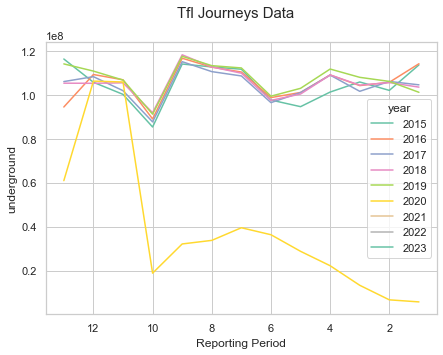

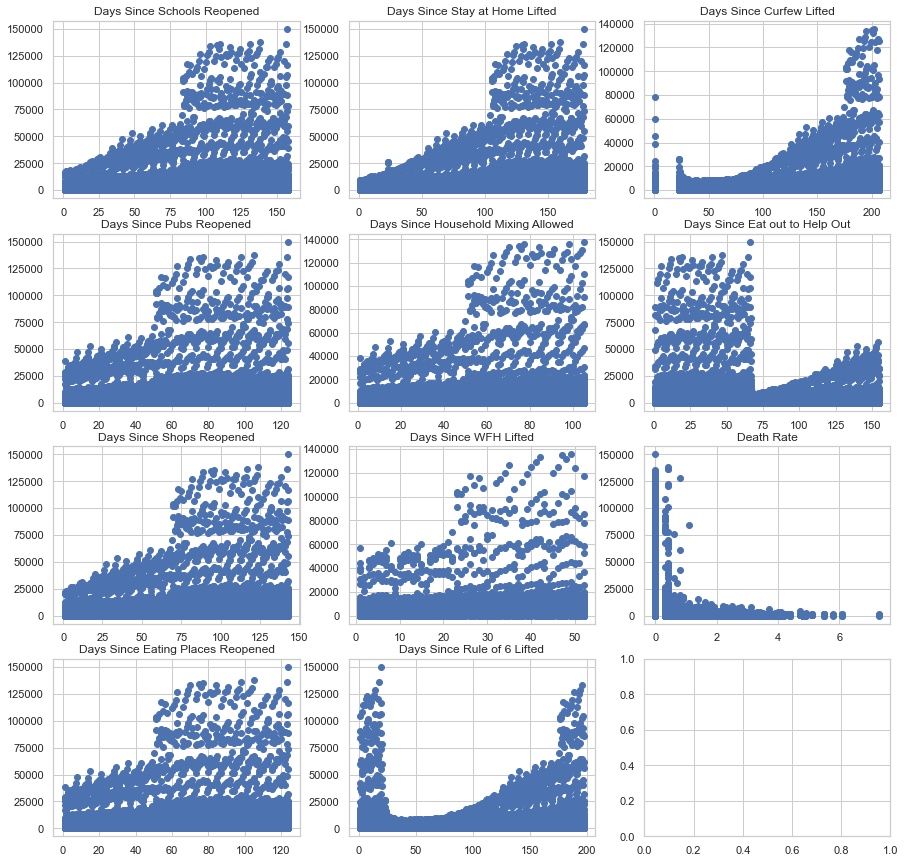

In [80]:
## Create datasets for plotting, annual, monthly, and weekly datasets

# Ideally, the days will be max numbers versus cutting out

#'death_rate', 
#'schools_closed', 
#'pubs_closed', 
#'shops_closed', 
#'eating_places_closed', 
#'stay_at_home', 
#'household_mixing_indoors_banned', 
#'wfh', 
#'rule_of_6_indoors', 
#'curfew', 
#'eat_out_to_help_out', 
#'daysstrt_schools_closed', 
#'daysstrt_pubs_closed', 
#'daysstrt_shops_closed', 
#'daysstrt_eating_places_closed', 
#'daysstrt_stay_at_home', 
#'daysstrt_household_mixing_indoors_banned', 
#'daysstrt_wfh', 
#'daysstrt_rule_of_6_indoors', 
#'daysstrt_curfew', 
#'daysstrt_eat_out_to_help_out', 
#'daysend_schools_closed', 
#'daysend_pubs_closed', 
#'daysend_shops_closed', 
#'daysend_eating_places_closed', 
#'daysend_stay_at_home', 
#'daysend_household_mixing_indoors_banned', 
#'daysend_wfh', 
#'daysend_rule_of_6_indoors', 
#'daysend_curfew', 
#'daysend_eat_out_to_help_out', 


#df_tube = df_tube.fillna(0)
# Weekly

#tube_weekly = df_tube.groupby(['year', 
#'month', 
#'week', 
#'NAME', 
#'GSS_CODE'])['origin_trips', 'destination_trips'].agg('sum').reset_index()

#print(df_tube['year'].unique())
#print(tube_weekly['year'].unique())

#tube_weekly = tube_weekly.merge(boroughs, left_on = ['NAME','GSS_CODE'], right_on = ['NAME','GSS_CODE'])
#print(tube_weekly['year'].unique())



# Monthly
#tfl_test = tfljourneys.groupby(['year', 'month', 'Reporting Period'])['underground', 'bus'].agg('sum').reset_index()
#tfl_test = tfl_test[(tfl_test['year'] >= 2017) & (tfl_test['year'] <= 2020)]


#tube_monthly = df_tube.groupby(['year', 
#'month', 
#'NAME', 
#'GSS_CODE'])['origin_trips', 'destination_trips'].agg('sum').reset_index()

#tube_monthly = tube_monthly.merge(boroughs, left_on = ['NAME','GSS_CODE'], right_on = ['NAME','GSS_CODE'])


# Annual

#tube_annual = df_tube.groupby(['year', 
#'NAME', 
#'GSS_CODE'])['origin_trips', 'destination_trips'].agg('sum').reset_index()

#tube_annual = tube_annual.merge(boroughs, left_on = ['NAME','GSS_CODE'], right_on = ['NAME','GSS_CODE'])

# No Boroughs

#tube_noboroughs = df_tube.groupby(['year', 
#'month', 
#'week',
#'day',
#'date',
#'travel_date',
#'schools_closed', 
#'pubs_closed', 
#'shops_closed', 
#'eating_places_closed', 
#'stay_at_home', 
#'household_mixing_indoors_banned', 
#'wfh', 
#'rule_of_6_indoors', 
#'curfew', 
#'eat_out_to_help_out', 
#'daysstrt_schools_closed', 
#'daysstrt_pubs_closed', 
#'daysstrt_shops_closed', 
#'daysstrt_eating_places_closed', 
#'daysstrt_stay_at_home', 
#'daysstrt_household_mixing_indoors_banned', 
#'daysstrt_wfh', 
#'daysstrt_rule_of_6_indoors', 
#'daysstrt_curfew', 
#'daysstrt_eat_out_to_help_out', 
#'daysend_schools_closed', 
#'daysend_pubs_closed', 
#'daysend_shops_closed', 
#'daysend_eating_places_closed', 
#'daysend_stay_at_home', 
#'daysend_household_mixing_indoors_banned', 
#'daysend_wfh', 
#'daysend_rule_of_6_indoors', 
#'daysend_curfew', 
#'daysend_eat_out_to_help_out', 
#])['origin_trips', 'destination_trips'].agg('sum').reset_index()

#cols = df_tube.columns

#cols = cols.drop(['day', 'date', 'travel_date', 'origin_trips', 'destination_trips', 'geometry'])

#cols_list = pd.Series(cols)

#cols_list

#test = df_tube.groupby(cols_list)['origin_trips', 'destination_trips'].agg('sum').reset_index

#print(cols_list)
#test

# Data Frame to calculate YoY changes 

#tube_pct = tube_covid.groupby(['year', 'month', 'msoa_name', 'msoa_code'])['origin_trips', 'destination_trips'].agg('sum').reset_index()

#tube_pct = tube_covid.groupby(['date', 'year', 'month', 'day', 'msoa_name', 'msoa_code']).agg({'origin_trips':'sum',
#                                                                        'destination_trips': 'sum',
#                                                                        'daysstrt_schools_closed': 'mean'}).reset_index()

#tube_pct = tube_pct.sort_values(by=['msoa_code', 'day', 'month', 'year'])

#tube_pct['orig_pctyoy'] = tube_pct['origin_trips'].pct_change()
#tube_pct['dest_pctyoy'] = tube_pct['destination_trips'].pct_change()

#tube_pct = tube_pct.merge(msoas, left_on = ['msoa_code'], right_on = ['MSOA11CD'])

#tube_pct = tube_pct[['year',
#                     'month',
#                     'day',
#                     'date',
#                     'msoa_name',
#                     'msoa_code',
#                     'daysstrt_schools_closed',
#                     'origin_trips',
#                     'destination_trips',
#                     'orig_pctyoy',
#                     'dest_pctyoy',
#                     'geometry']]

#tube_pct

#fig, ax = plt.subplots(1, 1, figsize=(7, 5), sharex=False, sharey=False)
#fig.suptitle('Tfl Journeys Data', fontsize=15)
#sns.lineplot(data = tfljourneys, x = "Reporting Period", y = "underground", hue = "year", ci = None, palette = "Set2")
#ax.invert_xaxis()

#df = tubecovid_pct[(tubecovid_pct['travel_date']>='03/23/2020')&(tubecovid_pct['travel_date']<='11/05/2020')&(tubecovid_pct['dest_pctyoy']<=2)]

#f,ax = plt.subplots(4, 3, figsize = (15,15))
#ax0 = ax.flatten()

#cols_to_plot = ['daysend_schools_closed',
#                                'daysend_pubs_closed',
#                                'daysend_shops_closed',
#                                'daysend_eating_places_closed',
#                                'daysend_stay_at_home',
#                                'daysend_household_mixing_indoors_banned',
#                                'daysend_wfh',
#                                'daysend_rule_of_6_indoors',
#                                'daysend_curfew',
#                                'daysend_eat_out_to_help_out']

#sns.scatterplot(data = df, x = "daysstrt_pubs_closed", y = "dest_pctyoy", palette = 'crest')#, ax=ax[0])
#ax[0,0].scatter(data = df[df['daysend_schools_closed']>=0], x = "daysend_schools_closed", y = "destination_trips")
#ax[1,0].scatter(data = df[df['daysend_pubs_closed']>=0], x = "daysend_pubs_closed", y = "destination_trips")
#ax[2,0].scatter(data = df[df['daysend_shops_closed']>=0], x = "daysend_shops_closed", y = "destination_trips")
#ax[3,0].scatter(data = df[df['daysend_eating_places_closed']>=0], x = "daysend_eating_places_closed", y = "destination_trips")
#ax[0,1].scatter(data = df[df['daysend_stay_at_home']>=0], x = "daysend_stay_at_home", y = "destination_trips")
#ax[1,1].scatter(data = df[df['daysend_household_mixing_indoors_banned']>=0], x = "daysend_household_mixing_indoors_banned", y = "destination_trips")
#ax[2,1].scatter(data = df[df['daysend_wfh']>=0], x = "daysend_wfh", y = "destination_trips")
#ax[3,1].scatter(data = df[df['daysend_rule_of_6_indoors']>=0], x = "daysend_rule_of_6_indoors", y = "destination_trips")
#ax[0,2].scatter(data = df[df['daysend_curfew']>=0], x = "daysend_curfew", y = "destination_trips")
#ax[1,2].scatter(data = df[df['daysend_eat_out_to_help_out']>=0], x = "daysend_eat_out_to_help_out", y = "destination_trips")
#ax[2,2].scatter(data = df, x = "death_rate", y = "destination_trips")



#ax[0,0].set_title('Days Since Schools Reopened')
#ax[1,0].set_title('Days Since Pubs Reopened')
#ax[2,0].set_title('Days Since Shops Reopened')
#ax[3,0].set_title('Days Since Eating Places Reopened')
#ax[0,1].set_title('Days Since Stay at Home Lifted')
#ax[1,1].set_title('Days Since Household Mixing Allowed')
#ax[2,1].set_title('Days Since WFH Lifted')
#ax[3,1].set_title('Days Since Rule of 6 Lifted')
#ax[0,2].set_title('Days Since Curfew Lifted')
#ax[1,2].set_title('Days Since Eat out to Help Out')
#ax[2,2].set_title('Death Rate')